# Outline


When participants complete the simple perceptual decision-making task, results are usually presented in the form of response time(rt) and response. Drift diffusion model can be applied to decomposed the underlying cognitive process. The full ddm has seven parameters: drift rate(v), starting point(z), decision boundary(a), non-decision time(t), variability of drift rate(sv), variability of starting point(sz), variability of non-decision time(st).<br>
<br>
Currently, there is a challenge in determining which response decision boundary correspond to as various can lead to different distribution that affect the estimated parameters. If the boundary is mapped to the accuracy, it is called accuracy coding, instead, it is called stimulus coding.<br>
<br>
This purpose of this script is to determine which response coding method is more appropriate for our data.<br><br>



<p style="font-family: Times New Roman; word-wrap: break-word;">
We use a tree structure to illustrate the impact of the different steps
</p>

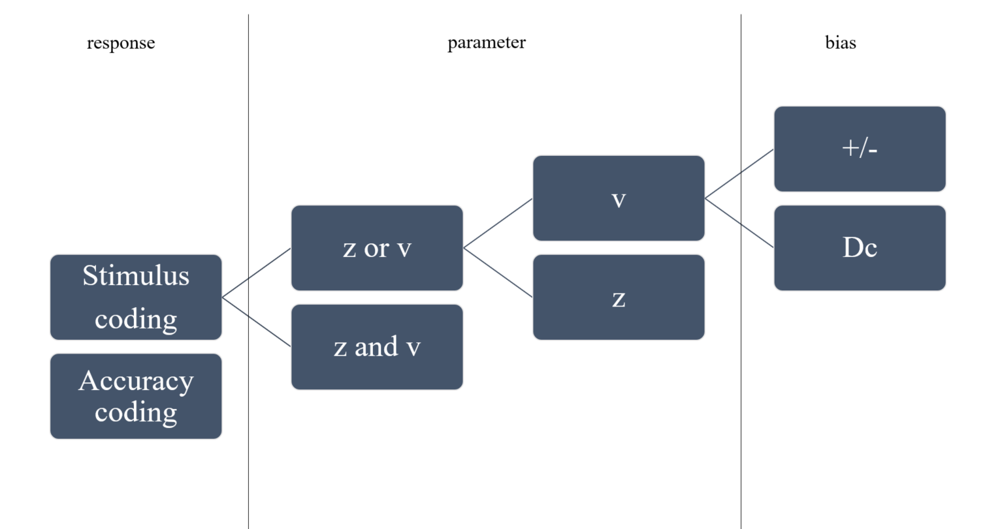

Accuracy coding eliminates the influence of the stimulus, while stimulus coding requires considering the influence of the stimulus. 

So if accuracy coding, we should not consider the influence of bias of stimulus. While stimulus coding, we required to consider the influence of stimulus and explore which parameter lead to the bias and how it generate the bias.
   
As the previous literature has revealed, the stimulus bias may happened in the parameter `v`  and `z`.

The first problem is whether the stimulus bias influence only one parameter or both parameter.

If both parameters have been influenced, two bias need to be considered, instead, we require to select which parameter need to be affected.

When the influenced parameter is z, the stimulus bias is that `z` for stimulus A and `1-z` for stimulus B.

When the influenced parameter is v, the stimulus bias is that 'v+dc' for stimulus A and '-v+dc' for stimulus B, where dc is the bias. Both are same essentially. we assume $ z = 1/2 + zbias $, then $1-z = 1/2 - zbias$.  

Points to note that, in the above case, we implicitly assume several things

Assumption1: zbias and vbias cannot happened in the same time, the reason we haven't know. So when stimulus coding influence both z and v, zbias exists, but vbias doesn't exist, only positive and negative v is corresponding to each stimulus. This method is equivalent to the accuracy coding.

Assumption2: zbias only work in the way of z,1-z. vbias work in the way of +/- or dc.

So, in reality, we have 4 method to coding our results, 4 hypothesis has formed.

1. accuracy coding

2. stimulus coding, z bias

3. stimulus coding, v bias, positive/negative

4. stimulus coding, v bias, dc.

# Accuracy coding

In this scenario, we eliminated the influence of the stimulus. In other words, the individual's propensity for stimulus is offset by the seetiong of boundaries. At the same time, zbias and vbiasare in the simultaneous presence is intractable.

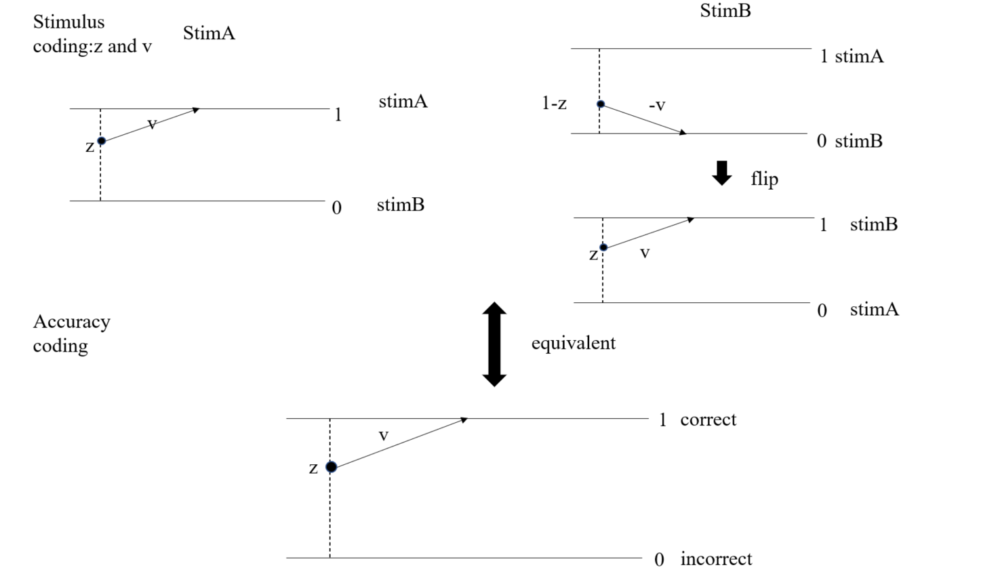

In [114]:
#system
import sys
import os
#variable
from collections import OrderedDict
from copy import deepcopy
import numpy as np
import pandas as pd
from patsy import dmatrix
#plot
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import arviz as az
import ptitprince as pt
# model
import kabuki
import hddm
from hddm import HDDMRegressor
# stats
import bambi as bmb

In [115]:
print(f'The version of python is {sys.version}')
print(f'The version of numpy is {np.__version__}')
print(f'The version of pandas is {pd.__version__}')
print(f'The version of matplotlib is {matplotlib.__version__}')
print(f'The version of seaborn is {sns.__version__}')
print(f'The version of arviz is {az.__version__}')
print(f'The version of hddm is {hddm.__version__}')
print(f'The version of kabuki is {kabuki.__version__}')
print(f'The version of bambi is {bmb.__version__}')

The version of python is 3.8.8 | packaged by conda-forge | (default, Feb 20 2021, 16:22:27) 
[GCC 9.3.0]
The version of numpy is 1.20.3
The version of pandas is 1.3.5
The version of matplotlib is 3.3.4
The version of seaborn is 0.11.2
The version of arviz is 0.12.0
The version of hddm is 0.8.0
The version of kabuki is 0.6.4
The version of bambi is 0.8.0


## Generate random parameter and performance

In [116]:
n_subjs=12
n_trials=50
effect=0
n_cond = 1

In [117]:
# set the figure theme
sns.set_theme(style="whitegrid")
# set random seed
np.random.seed(123)

In [118]:
# generate params at population level
params = hddm.generate.gen_rand_params()
params['v_slope'] = effect
params['v_inter'] = 1
params['sv'] = 0
params['z'] = 0.7
del params['v']
reg_outcomes=['v']
share_noise = ('a','v','t','st','sz','sv','z', 'v_slope', 'v_inter')
group_params=[]

# set valid param ranges
bounds = {'a': (0, np.inf),
          'z': (0, 1),
          't': (0, np.inf), 
          'st': (0, np.inf),
          'sv': (0, np.inf),
          'sz': (0, 1)
}
for i_subj in range(n_subjs):
    # generate params at subject level
    subj_params = kabuki.generate._add_noise({'none': params}, 
                               noise=OrderedDict([('v', 0.2),
                               ('a', 0.2),
                               ('t', 0.1),
                               ('sv', 0.1),
                                ('z',0.1),
                               ('v_inter', 0.1)]), 
                               share_noise=share_noise,
                                        check_valid_func=hddm.utils.check_params_valid,
                                        bounds=bounds,
                                        exclude_params={'reg_outcomes', 'st', 'sv', 'sz'})['none']

    #generate v
    wfpt_params = deepcopy(subj_params)
    wfpt_params.pop('v_inter')
    effect = wfpt_params.pop('v_slope')
    x1 = np.random.randint(2,size=n_trials)
    x1 = np.arange(n_cond)
    wfpt_params['v'] = (effect*x1) + subj_params['v_inter']

    #generate rt and choice of each trial
    i_params = deepcopy(wfpt_params)
    sampled_rts = pd.DataFrame(np.zeros((n_trials, 2)), columns=['rt', 'response'])
    for i_sample in x1:
        #get current params
        for p in reg_outcomes:
            i_params[p] = wfpt_params[p][i_sample]
        #sample
        sampled_rts.iloc[(0+int(n_trials/n_cond)*i_sample):(int(n_trials/n_cond)+int(n_trials/n_cond)*i_sample),:] = hddm.generate.gen_rts(size=int(n_trials/n_cond), method='drift', dt=1e-3, **i_params).values
    sampled_rts['subj_idx']=i_subj
    sampled_rts['cov']=np.ones(int(n_trials))
    subj_data=sampled_rts

    # create dataframe
    subj_params = pd.DataFrame([subj_params])
    # add subject
    subj_params['subj_idx'] = i_subj
    subj_params['v']=wfpt_params['v'].mean()


    # param v
    subj_v = pd.DataFrame({'v':wfpt_params['v'],
             'cov':x1,
            'subj_idx':i_subj})


    #concatante subj_data to group_data
    if i_subj == 0:
        group_params = subj_params
    else:
        group_params = pd.concat((group_params, subj_params), ignore_index=True)

    #concatante subj_data to group_data
    if i_subj == 0:
        data = subj_data
    else:
        data = pd.concat((data, subj_data), ignore_index=True)

    #concatante subj_data to group_data
    if i_subj == 0:
        wfpt_v = subj_v
    else:
        wfpt_v = pd.concat((wfpt_v, subj_v), ignore_index=True)

In [119]:
data

,rt,response,subj_idx,cov
0,0.329097,1.0,0,1.0
1,0.351097,1.0,0,1.0
2,0.343097,1.0,0,1.0
3,0.337097,1.0,0,1.0
4,0.329097,1.0,0,1.0
...,...,...,...,...
595,0.300295,1.0,11,1.0
596,0.508295,1.0,11,1.0
597,0.388295,1.0,11,1.0
598,0.657663,0.0,11,1.0


In [120]:
group_params

,sv,sz,st,z,t,a,v_slope,v_inter,subj_idx,v
0,0,0,0,0.873837,0.326487,0.904698,0,0.994848,0,0.994848
1,0,0,0,0.731965,0.211472,0.674299,0,1.107417,1,1.107417
2,0,0,0,0.700266,0.250406,0.515315,0,1.084967,2,1.084967
3,0,0,0,0.628677,0.328022,1.076377,0,1.091049,3,1.091049
4,0,0,0,0.759728,0.235156,0.618497,0,0.968251,4,0.968251
5,0,0,0,0.784097,0.208697,1.329644,0,0.929510,5,0.929510
6,0,0,0,0.691844,0.352322,0.763398,0,1.104146,6,1.104146
7,0,0,0,0.654079,0.108076,0.875691,0,0.871428,7,0.871428
8,0,0,0,0.683256,0.293714,0.704354,0,0.971689,8,0.971689
9,0,0,0,0.699605,0.209150,0.900084,0,0.838134,9,0.838134


## Visualisation Result

Then, we use raincloud pcture to show the group-level parameters and subject-level parameters as well as the generated data.

In [121]:
param = group_params

In [122]:
# select the specific coloumn
param = param[['v','a','t','z','subj_idx']]
# store the wide data to linear regression
param_pm = param
# wide to long
param = param.melt(id_vars='subj_idx', 
                   var_name='param', 
                   value_name='value' )

Text(0.5, 0, 't')

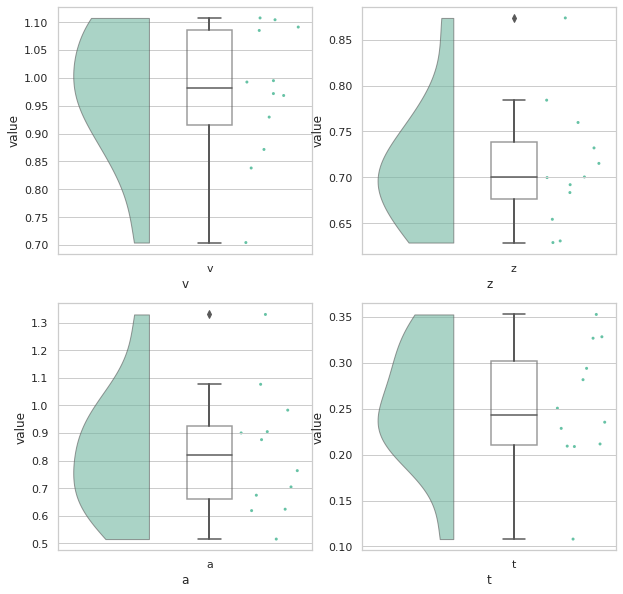

In [123]:
# create figure
f, ax = plt.subplots(2,2,figsize=(10, 10))
# the right figure
# v
ax[0,0]=pt.RainCloud(x = 'param', 
                  y = 'value', 
                  data = param[param['param']=='v'], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[0,0])
ax[0,0].set_xlabel('v')
# z
ax[0,1]=pt.RainCloud(x = 'param', 
                  y = 'value', 
                  data = param[param['param']=='z'], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[0,1])
ax[0,1].set_xlabel('z')
# a
ax[1,0]=pt.RainCloud(x = 'param', 
                  y = 'value', 
                  data = param[param['param']=='a'], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[1,0])
ax[1,0].set_xlabel('a')
# t
ax[1,1]=pt.RainCloud(x = 'param', 
                  y = 'value', 
                  data = param[param['param']=='t'], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[1,1])
ax[1,1].set_xlabel('t')


In [124]:
print('the mean of parameter v is {:.3f} and the std is {:.3f} '.format(param_pm.v.mean(), param_pm.v.std()))
print('the mean of parameter z is {:.3f} and the std is {:.3f} '.format(param_pm.z.mean(), param_pm.z.std()))
print('the mean of parameter a is {:.3f} and the std is {:.3f} '.format(param_pm.a.mean(), param_pm.a.std()))
print('the mean of parameter t is {:.3f} and the std is {:.3f} '.format(param_pm.t.mean(), param_pm.t.std()))

the mean of parameter v is 0.972 and the std is 0.123 
the mean of parameter z is 0.713 and the std is 0.069 
the mean of parameter a is 0.831 and the std is 0.229 
the mean of parameter t is 0.253 and the std is 0.068 


<AxesSubplot:xlabel='response', ylabel='rt'>

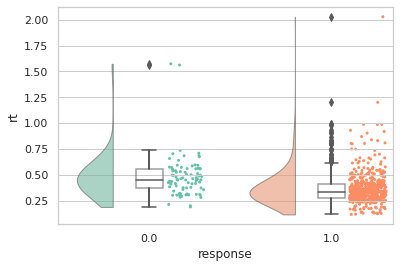

In [125]:
# the rt distribution
pt.RainCloud(x = 'response', 
                  y = 'rt', 
                  data = data, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2)

## Constructing the model and fitting it


Because we only assignate the effcet into parameter v, so our model only have one parameter vary with the covariance.

In [126]:
m = hddm.HDDMRegressor(data, 
                       {'v~1','z~1','a~1','t~1'},
                       include=['z'],
                       group_only_regressors=False,
                       keep_regressor_trace=True,
                      )
m.sample(3000,burn=1000)

Adding these covariates:
['a_Intercept']
Adding these covariates:
['v_Intercept']
Adding these covariates:
['t_Intercept']
Adding these covariates:
['z_Intercept']
 [-----------------100%-----------------] 3001 of 3000 complete in 801.8 sec

### Inspect the trace

Plotting a_Intercept
Plotting a_Intercept_std
Plotting v_Intercept
Plotting v_Intercept_std
Plotting t_Intercept
Plotting t_Intercept_std
Plotting z_Intercept
Plotting z_Intercept_std


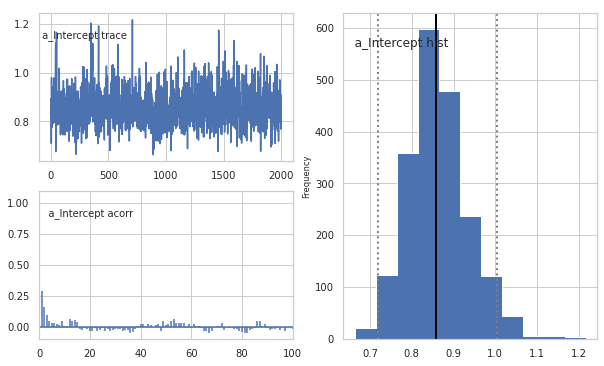

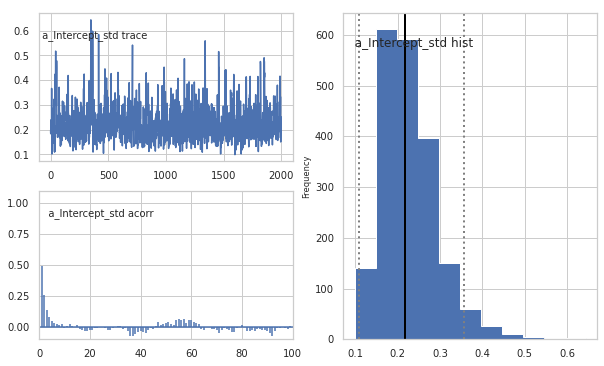

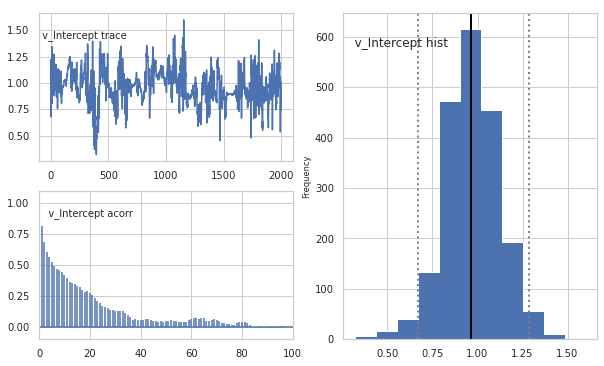

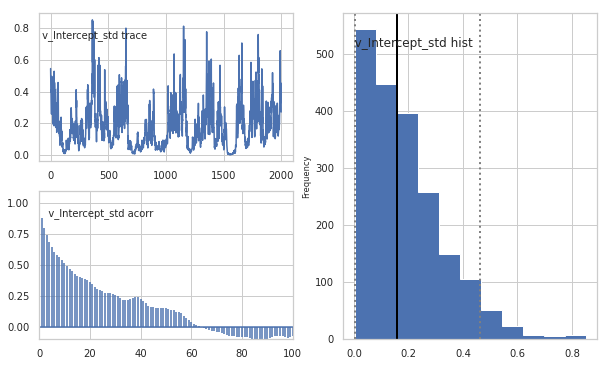

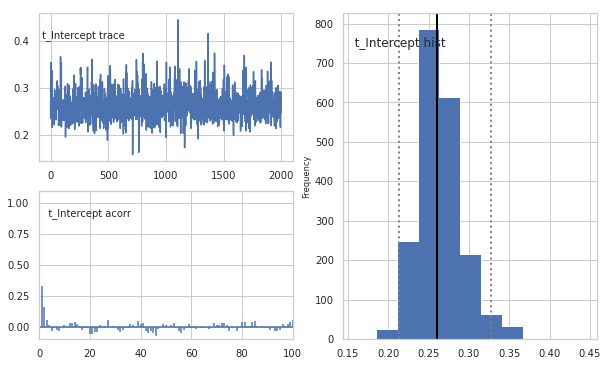

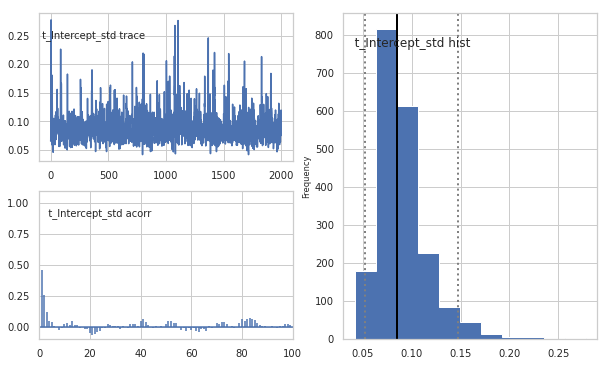

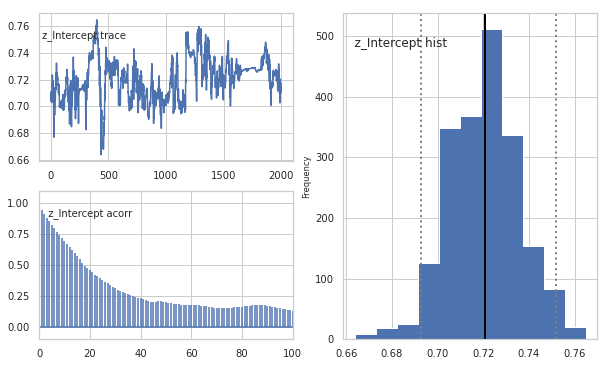

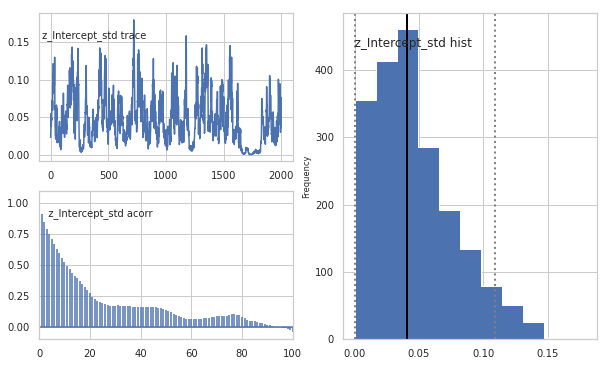

In [127]:
m.plot_posteriors()

Inspect the trace of each paramter, the sample of them is close to Convergence.

In [128]:
m.get_traces().to_csv('mres2.csv')

In [129]:
m1res_trace = pd.read_csv('mres2.csv')

### Inspect the results

After the sample of trace has convergened, we should check whether the value of parameter estimated by the model is similar to the value we set.

#### group-level params

In [130]:
%clear

In [131]:
params

{'sv': 0,
 'sz': 0,
 'st': 0,
 'z': 0.7,
 't': 0.2858418004851139,
 'a': 0.8402771803463047,
 'v_slope': 0,
 'v_inter': 1}

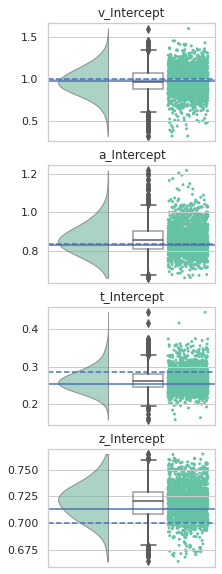

In [133]:
pms = ['v_Intercept','a_Intercept','t_Intercept','z_Intercept']
# create figure
f,ax = plt.subplots(4,figsize=(3,10))
for i,pm in enumerate(pms):
    if pm == 'a_Intercept' :
        varname = os.path.join(str(pm))
        data = m1res_trace[varname]
        # ground parameter of group effect
        gpm = group_params['a'].mean()
        gpm_g = params['a']
    elif pm == 'v_Intercept':
        varname = os.path.join(str(pm ))
        data = m1res_trace[varname]
        gpm=group_params['v_inter'].mean()
        gpm_g = params['v_inter']
    elif pm == 't_Intercept':
        varname = os.path.join(str(pm ))
        data = m1res_trace[varname]
        gpm=group_params['t'].mean()
        gpm_g = params['t']
    elif pm == 'z_Intercept':
        varname = os.path.join(str(pm +'_trans'))
        data = 1/(1+np.exp(-m1res_trace[varname]))
        gpm=group_params['z'].mean()
        gpm_g = params['z']
    
    # raincloud
    ax_i = pt.RainCloud(data = data, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax[i])
    ax_i.axhline(gpm)
    ax_i.axhline(gpm_g, ls='--')
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(pm)

The dash line represent the group level parameter we set, the solid line is the mean of subject parameters.

We can see the mean of estimated parameters is close to the true parameter. The result of parameter recovery of group-level is acceptable.

#### subject-level params

##### v

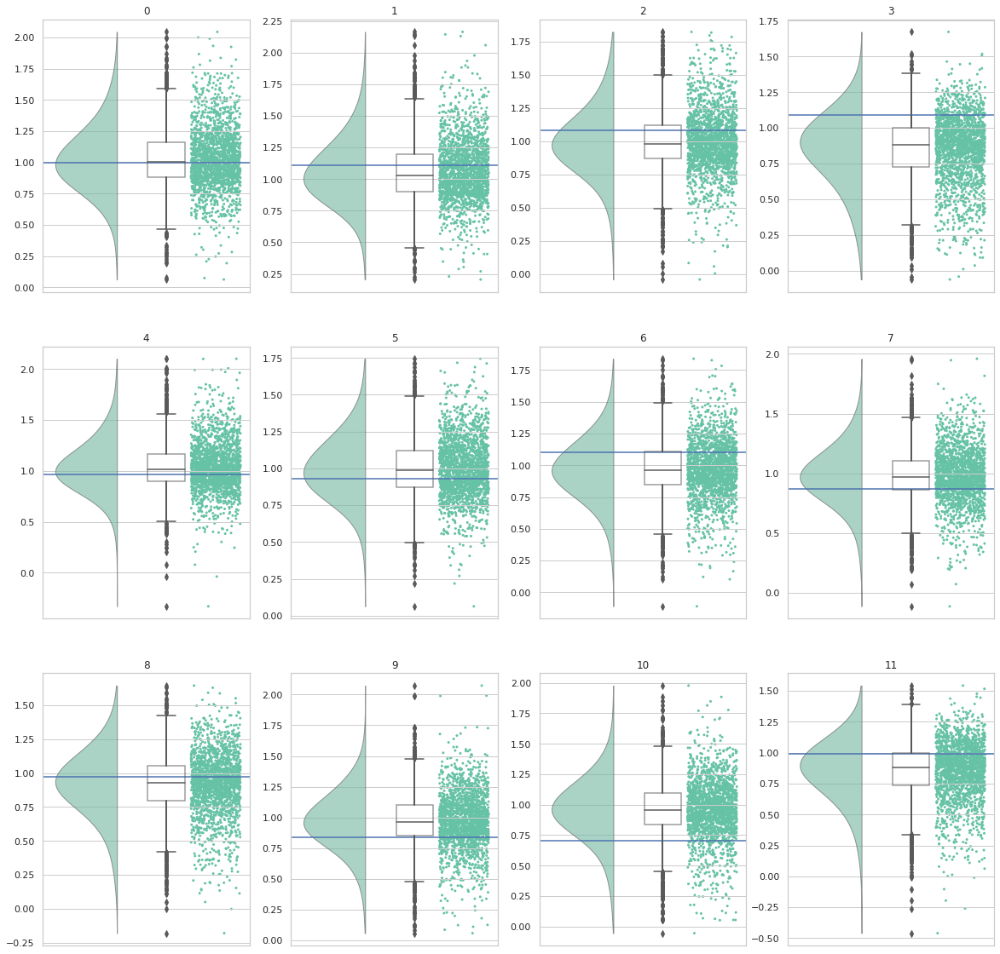

In [134]:
param = 'v'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj.'+ str(i)))
    # ground parameter of subject effect
    spm =  param_pm.loc[param_pm['subj_idx']==i,'v'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = m1res_trace[varname], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

##### z

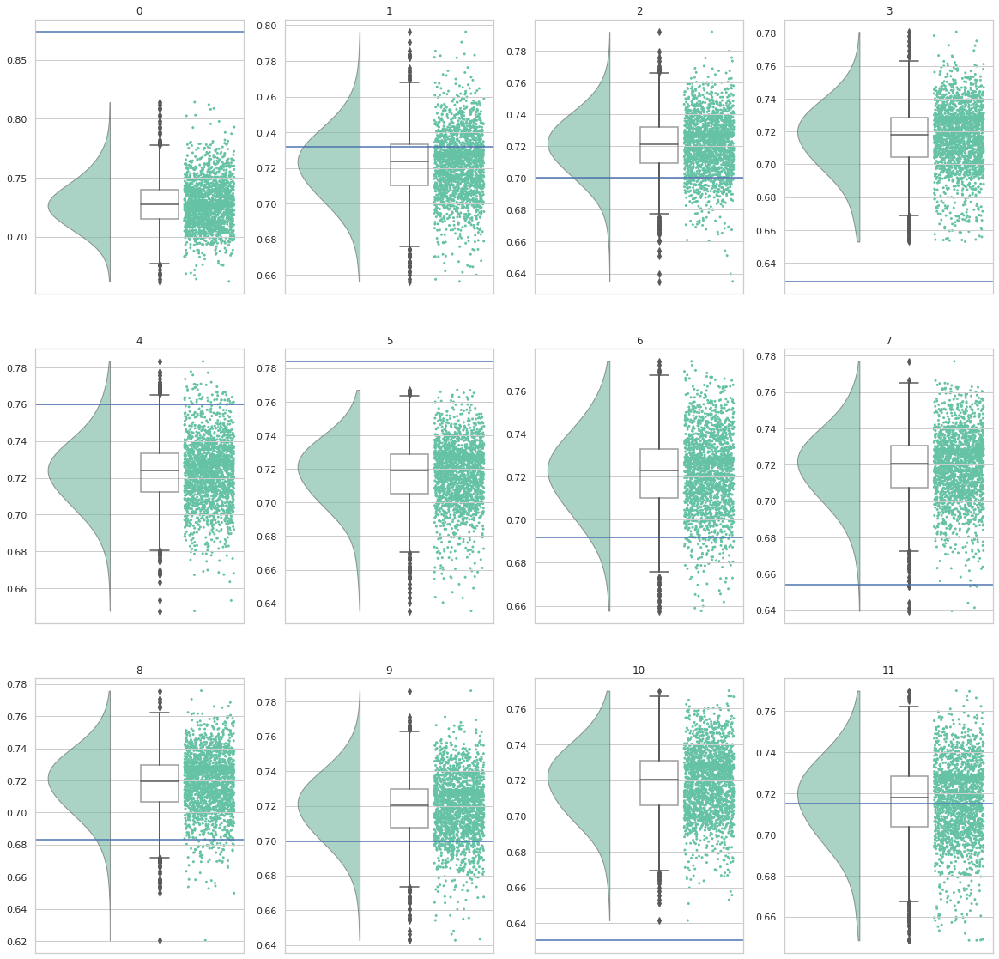

In [135]:
param = 'z'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj_trans.'+ str(i)))
    # ground parameter of subject effect
    spm =  param_pm.loc[param_pm['subj_idx']==i,'z'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = 1/(1+np.exp(-m1res_trace[varname])), 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

##### t

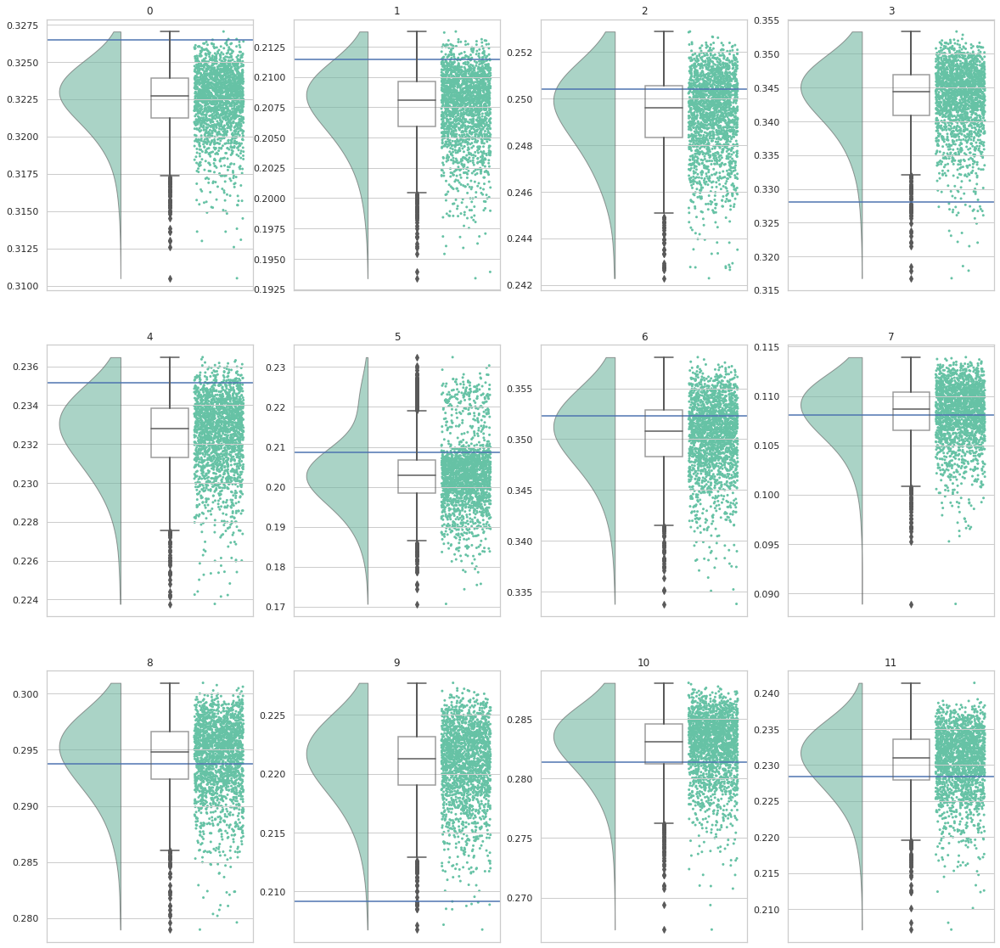

In [136]:
param = 't'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj.'+ str(i)))
    # ground parameter of subject effect
    spm =  param_pm.loc[param_pm['subj_idx']==i,'t'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = m1res_trace[varname], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

##### a

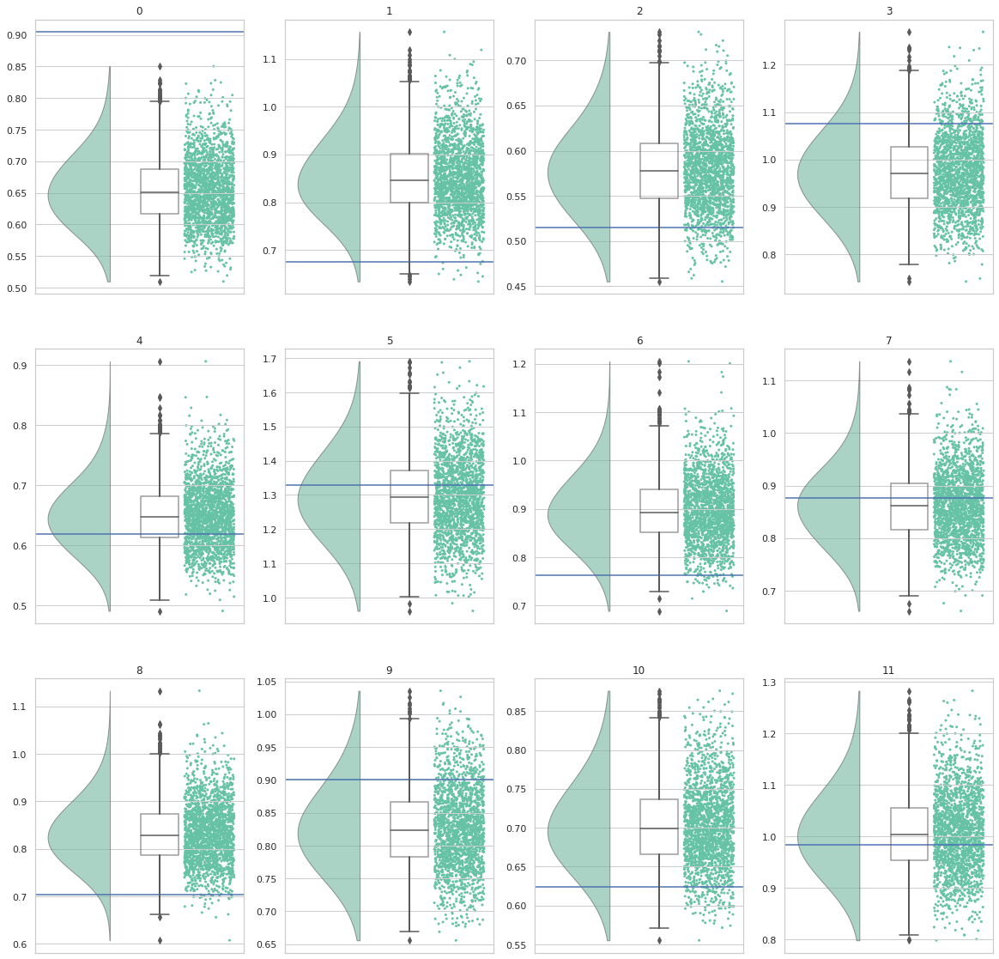

In [137]:
param = 'a'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj.'+ str(i)))
    # ground parameter of subject effect
    spm =  param_pm.loc[param_pm['subj_idx']==i,'a'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = m1res_trace[varname], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

But the result of parameter recovery of subject-level is not so acceptable than group-level. 

# stimulus coding, z bias

In this scenario, we assume the stim coding influence the parameter. z for stimA and 1-z for stimB. Other parameters are same.

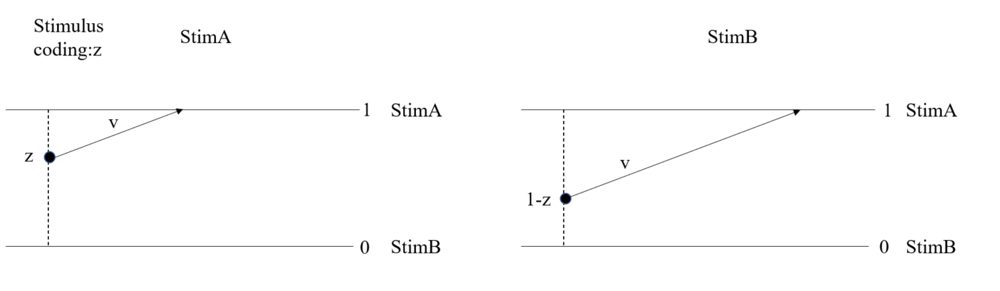

## Generate random parameter and performance

In [138]:
n_subjs=12
n_trials=25
effect=0
n_cond = 1

In [139]:
# set the figure theme
sns.set_theme(style="whitegrid")
# set random seed
np.random.seed(123)

In [140]:
data_stim =[]
group_params_stim =[]


# generate params at population level
params = hddm.generate.gen_rand_params()
params['v_slope'] = effect
params['v_inter'] = 1
params['sv'] = 0

del params['v']
reg_outcomes=['v']
share_noise = ('a','v','t','st','sz','sv','z', 'v_slope', 'v_inter')
group_params=[]

# set valid param ranges
bounds = {'a': (0, np.inf),
          'z': (0, 1),
          't': (0, np.inf), 
          'st': (0, np.inf),
          'sv': (0, np.inf),
          'sz': (0, 1)
}
for i_subj in range(n_subjs):
    for stim in [0,1]:
        # generate params at subject level
        if stim ==0:
            params['z'] = 0.7
            subj_params_tmp = kabuki.generate._add_noise({'none': params}, 
                                       noise=OrderedDict([('v', 0.2),
                                       ('a', 0.2),
                                       ('t', 0.1),
                                       ('sv', 0.1),
                                        ('z',0.1),
                                       ('v_inter', 0.1)]), 
                                       share_noise=share_noise,
                                                check_valid_func=hddm.utils.check_params_valid,
                                                bounds=bounds,
                                                exclude_params={'reg_outcomes', 'st', 'sv', 'sz'})['none']
            
        else:
            subj_params_tmp['z'] = 1 -  subj_params_tmp['z']
            
        #generate v
        wfpt_params = deepcopy(subj_params_tmp)
        wfpt_params.pop('v_inter')
        effect = wfpt_params.pop('v_slope')
        x1 = np.random.randint(2,size=n_trials)
        x1 = np.arange(n_cond)
        wfpt_params['v'] = (effect*x1) + subj_params_tmp['v_inter']

        #generate rt and choice of each trial
        i_params = deepcopy(wfpt_params)
        sampled_rts = pd.DataFrame(np.zeros((n_trials, 2)), columns=['rt', 'response'])
        for i_sample in x1:
            #get current params
            for p in reg_outcomes:
                i_params[p] = wfpt_params[p][i_sample]
            #sample
            sampled_rts.iloc[(0+int(n_trials/n_cond)*i_sample):(int(n_trials/n_cond)+int(n_trials/n_cond)*i_sample),:] = hddm.generate.gen_rts(size=int(n_trials/n_cond), method='drift', dt=1e-3, **i_params).values
        sampled_rts['subj_idx']=i_subj
        sampled_rts['cov']=np.ones(int(n_trials))
        sampled_rts['stim']=stim
        subj_data=sampled_rts

        # create dataframe
        subj_params = pd.DataFrame([subj_params_tmp])
        # add subject
        subj_params['subj_idx'] = i_subj
        subj_params['v']=wfpt_params['v'].mean()
        subj_params['stim']=stim


        # param v
        subj_v = pd.DataFrame({'v':wfpt_params['v'],
                 'cov':x1,
                'subj_idx':i_subj})


        if stim==0:    
            data_stim = subj_data
        else:
            data_stim = pd.concat((data_stim, subj_data), ignore_index=True)
        if stim == 0:
            group_params_stim = subj_params
        else:
            group_params_stim = pd.concat((group_params_stim, subj_params), ignore_index=True)
        
        
        
        
        
    #concatante subj_data to group_data
    if i_subj == 0:
        group_params = group_params_stim
    else:
        group_params = pd.concat((group_params, group_params_stim), ignore_index=True)

    #concatante subj_data to group_data
    if i_subj == 0:
        data = data_stim
    else:
        data = pd.concat((data, data_stim), ignore_index=True)

    #concatante subj_data to group_data
    if i_subj == 0:
        wfpt_v = subj_v
    else:
        wfpt_v = pd.concat((wfpt_v, subj_v), ignore_index=True)  

In [141]:
data

,rt,response,subj_idx,cov,stim
0,0.331097,1.0,0,1.0,0
1,0.365097,1.0,0,1.0,0
2,0.339097,1.0,0,1.0,0
3,0.331097,1.0,0,1.0,0
4,0.365097,1.0,0,1.0,0
...,...,...,...,...,...
595,0.242494,0.0,11,1.0,1
596,0.261448,1.0,11,1.0,1
597,0.240494,0.0,11,1.0,1
598,0.226494,0.0,11,1.0,1


In [142]:
group_params

,sv,sz,st,z,t,a,v_slope,v_inter,subj_idx,v,stim
0,0,0,0,0.873837,0.326487,0.904698,0,0.994848,0,0.994848,0
1,0,0,0,0.126163,0.326487,0.904698,0,0.994848,0,0.994848,1
2,0,0,0,0.731965,0.211472,0.674299,0,1.107417,1,1.107417,0
3,0,0,0,0.268035,0.211472,0.674299,0,1.107417,1,1.107417,1
4,0,0,0,0.700266,0.250406,0.515315,0,1.084967,2,1.084967,0
5,0,0,0,0.299734,0.250406,0.515315,0,1.084967,2,1.084967,1
6,0,0,0,0.628677,0.328022,1.076377,0,1.091049,3,1.091049,0
7,0,0,0,0.371323,0.328022,1.076377,0,1.091049,3,1.091049,1
8,0,0,0,0.675204,0.333614,0.490655,0,1.071600,4,1.071600,0
9,0,0,0,0.324796,0.333614,0.490655,0,1.071600,4,1.071600,1


## Visualisation Result

Then, we use raincloud pcture to show the group-level parameters and subject-level parameters as well as the generated data.

In [143]:
param = group_params

In [144]:
# select the specific coloumn
param = param[['v','a','t','z','subj_idx']]
# store the wide data to linear regression
param_pm = param
# wide to long
param = param.melt(id_vars='subj_idx', 
                   var_name='param', 
                   value_name='value' )

Text(0.5, 0, 't')

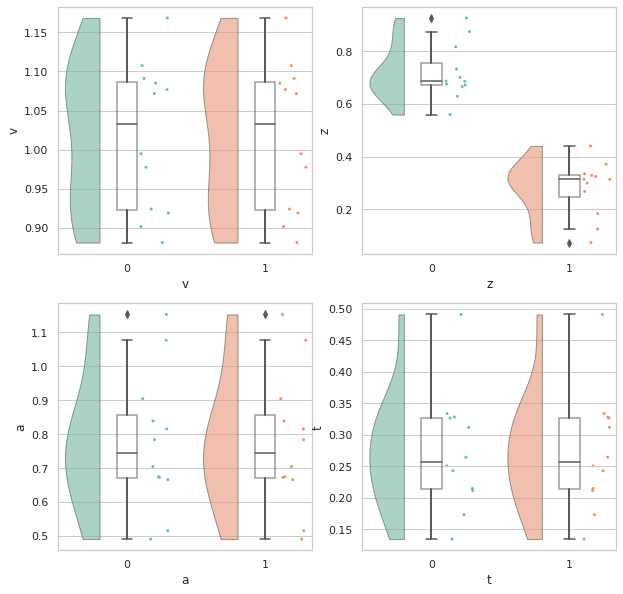

In [145]:
# create figure
f, ax = plt.subplots(2,2,figsize=(10, 10))
# the right figure
# v
ax[0,0]=pt.RainCloud(x = 'stim', 
                  y = 'v', 
                  data = group_params, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[0,0])
ax[0,0].set_xlabel('v')
# z
ax[0,1]=pt.RainCloud(x = 'stim', 
                  y = 'z', 
                  data = group_params, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[0,1])
ax[0,1].set_xlabel('z')
# a
ax[1,0]=pt.RainCloud(x = 'stim', 
                  y = 'a', 
                  data = group_params, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[1,0])
ax[1,0].set_xlabel('a')
# t
ax[1,1]=pt.RainCloud(x = 'stim', 
                  y = 't', 
                  data = group_params, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[1,1])
ax[1,1].set_xlabel('t')

<AxesSubplot:xlabel='response', ylabel='rt'>

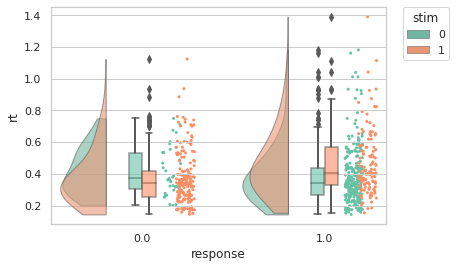

In [146]:
# the rt distribution
pt.RainCloud(x = 'response', 
                  y = 'rt', 
                  hue='stim',
                  data = data, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2)

## Constructing the model and fitting it


Because we only assignate the effcet into parameter v, so our model only have one parameter vary with the covariance.

In [147]:
def z_link_func(x, data=data):
    stim = (np.asarray(dmatrix('0 + C(s, [[0], [1]])',
                              {'s': data.stim.loc[x.index]},return_type='dataframe'))
    )
    # Apply z = (1 - x) to flip them along 0.5
    z_flip = np.subtract(stim, x.to_frame())
    # The above inverts those values we do not want to flip,
    # so invert them back
    z_flip[stim == 0] *= -1
    return z_flip

In [148]:
m = hddm.HDDMRegressor(data, 
                       ['v~1',{'model':'z~1','link_func':z_link_func},'a~1','t~1'],
                       include=['z'],
                       group_only_regressors=False,
                       keep_regressor_trace=True,
                      )
m.sample(3000,burn=1000)

Adding these covariates:
['v_Intercept']
Adding these covariates:
['z_Intercept']
Adding these covariates:
['a_Intercept']
Adding these covariates:
['t_Intercept']
 [-----------------100%-----------------] 3000 of 3000 complete in 1153.6 sec

### Inspect the trace

Plotting v_Intercept
Plotting v_Intercept_std
Plotting z_Intercept
Plotting z_Intercept_std
Plotting a_Intercept
Plotting a_Intercept_std
Plotting t_Intercept
Plotting t_Intercept_std


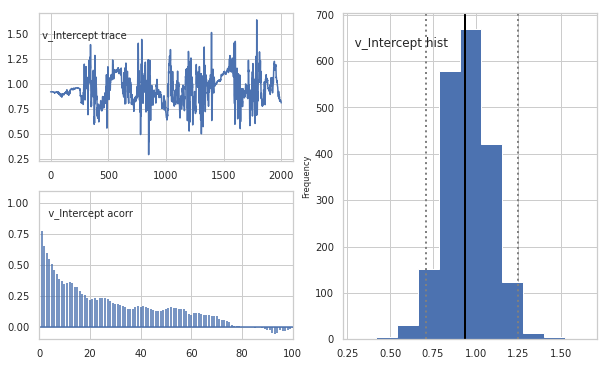

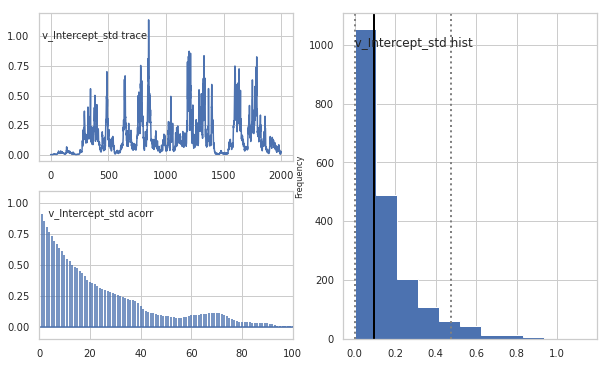

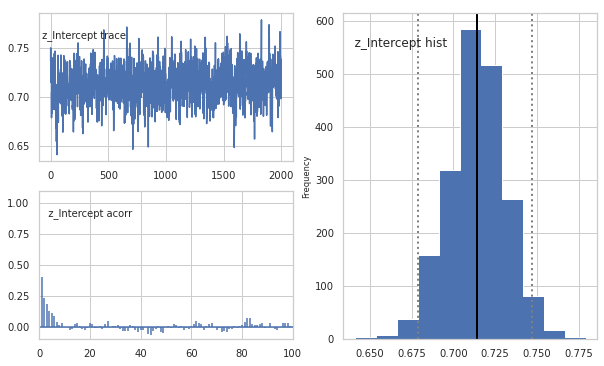

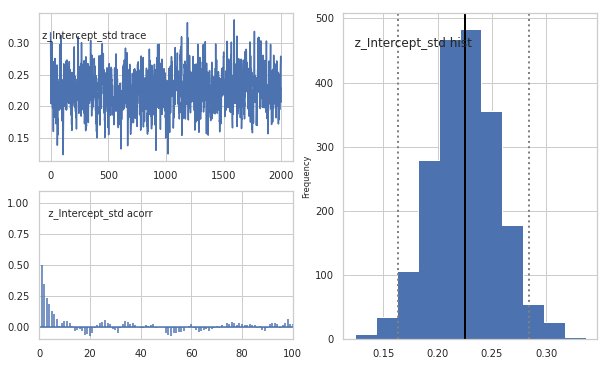

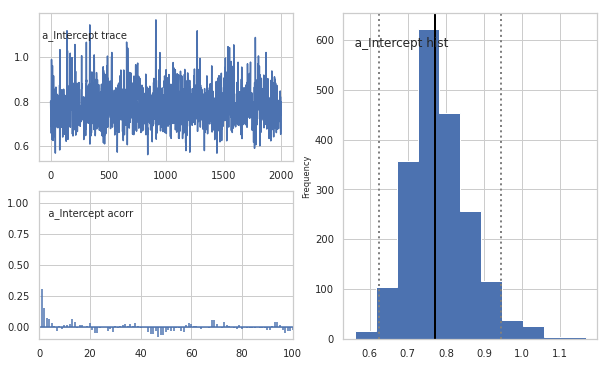

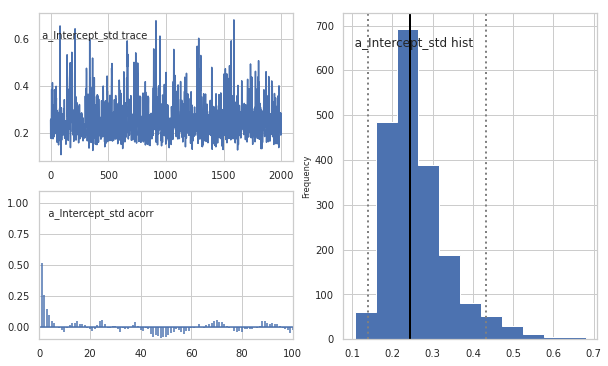

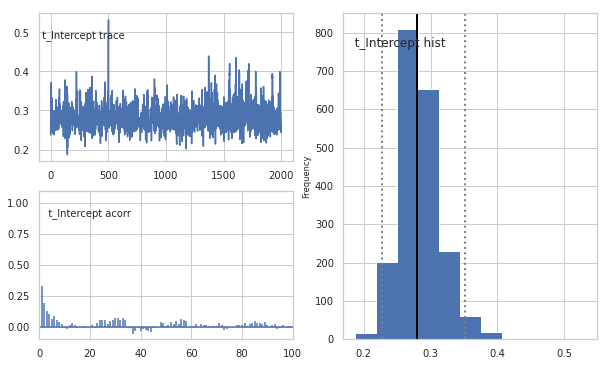

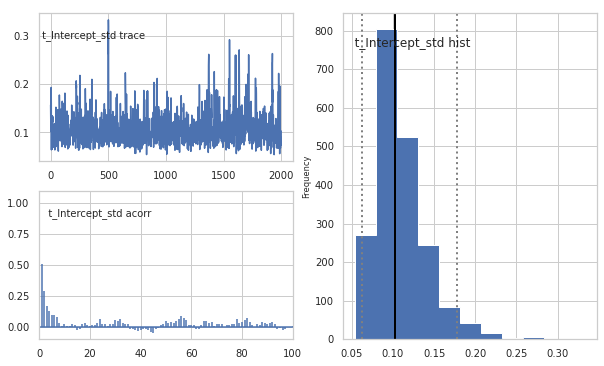

In [149]:
m.plot_posteriors()

Inspect the trace of each paramter, the sample of them is close to Convergence.

In [150]:
m.get_traces().to_csv('mres3.csv')

In [151]:
m1res_trace = pd.read_csv('mres3.csv')

### Inspect the results

After the sample of trace has convergened, we should check whether the value of parameter estimated by the model is similar to the value we set.

#### group-level params

In [152]:
params

{'sv': 0,
 'sz': 0,
 'st': 0,
 'z': 0.7,
 't': 0.2858418004851139,
 'a': 0.8402771803463047,
 'v_slope': 0,
 'v_inter': 1}

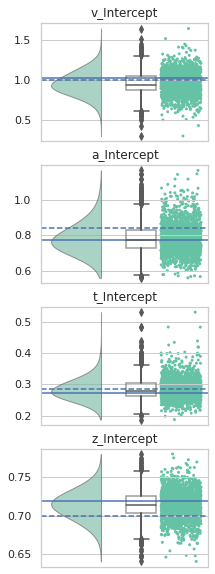

In [153]:
pms = ['v_Intercept','a_Intercept','t_Intercept','z_Intercept']
# create figure
f,ax = plt.subplots(4,figsize=(3,10))
for i,pm in enumerate(pms):
    if pm == 'a_Intercept' :
        varname = os.path.join(str(pm))
        data = m1res_trace[varname]
        # ground parameter of group effect
        gpm = param_pm['a'].mean()
        gpm_g = params['a']
    elif pm == 'v_Intercept':
        varname = os.path.join(str(pm ))
        data = m1res_trace[varname]
        gpm= param_pm['v'].mean()
        gpm_g = params['v_inter']
    elif pm == 't_Intercept':
        varname = os.path.join(str(pm ))
        data = m1res_trace[varname]
        gpm=param_pm['t'].mean()
        gpm_g = params['t']
    elif pm == 'z_Intercept':
        varname = os.path.join(str(pm +'_trans'))
        data = 1/(1+np.exp(-m1res_trace[varname]))
        gpm=group_params.loc[group_params['stim']==0,'z'].mean()
        gpm_g = params['z']
    
    # raincloud
    ax_i = pt.RainCloud(data = data, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax[i])
    ax_i.axhline(gpm)
    ax_i.axhline(gpm_g, ls='--')
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(pm)

The dash line represent the group level parameter we set, the solid line is the mean of subject parameters.

We can see the mean of estimated parameters is close to the true parameter. The result of parameter recovery of group-level is acceptable.

#### subject-level params

##### v

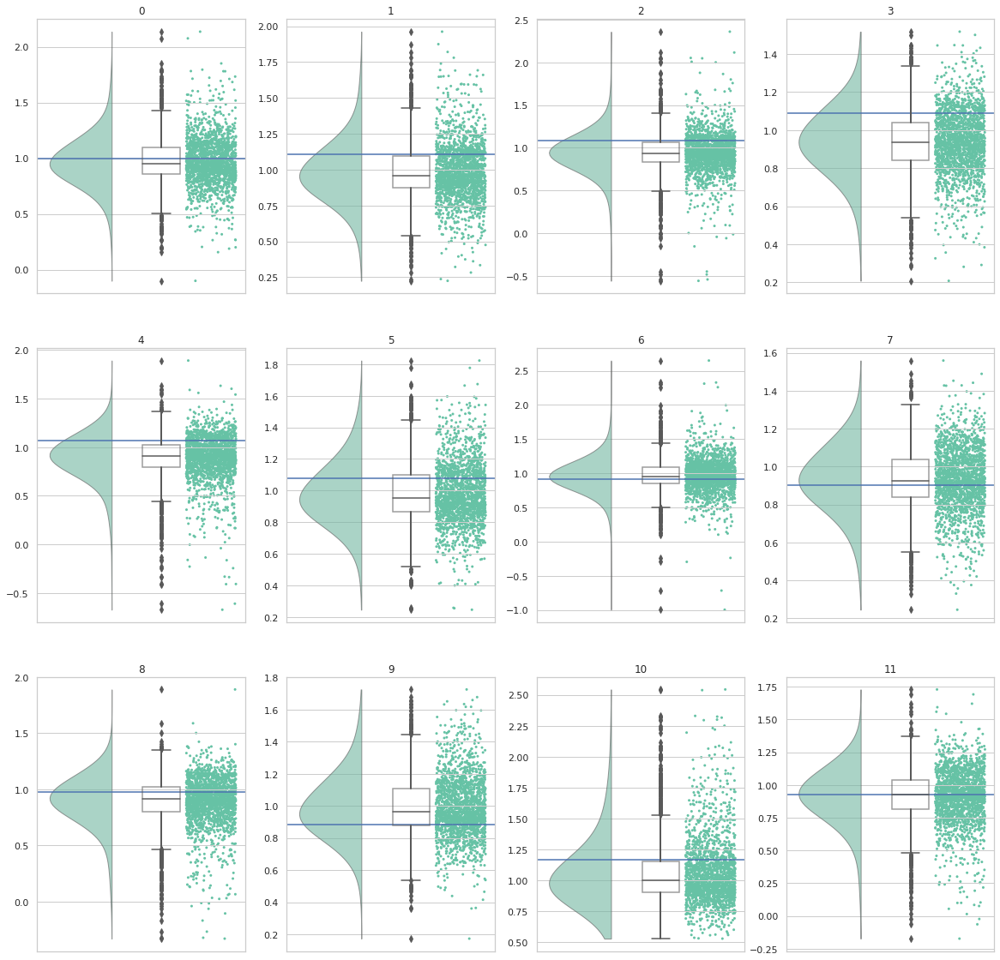

In [154]:
param = 'v'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj.'+ str(i)))
    # ground parameter of subject effect
    spm =  group_params.loc[group_params['subj_idx']==i,'v'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = m1res_trace[varname], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

##### z

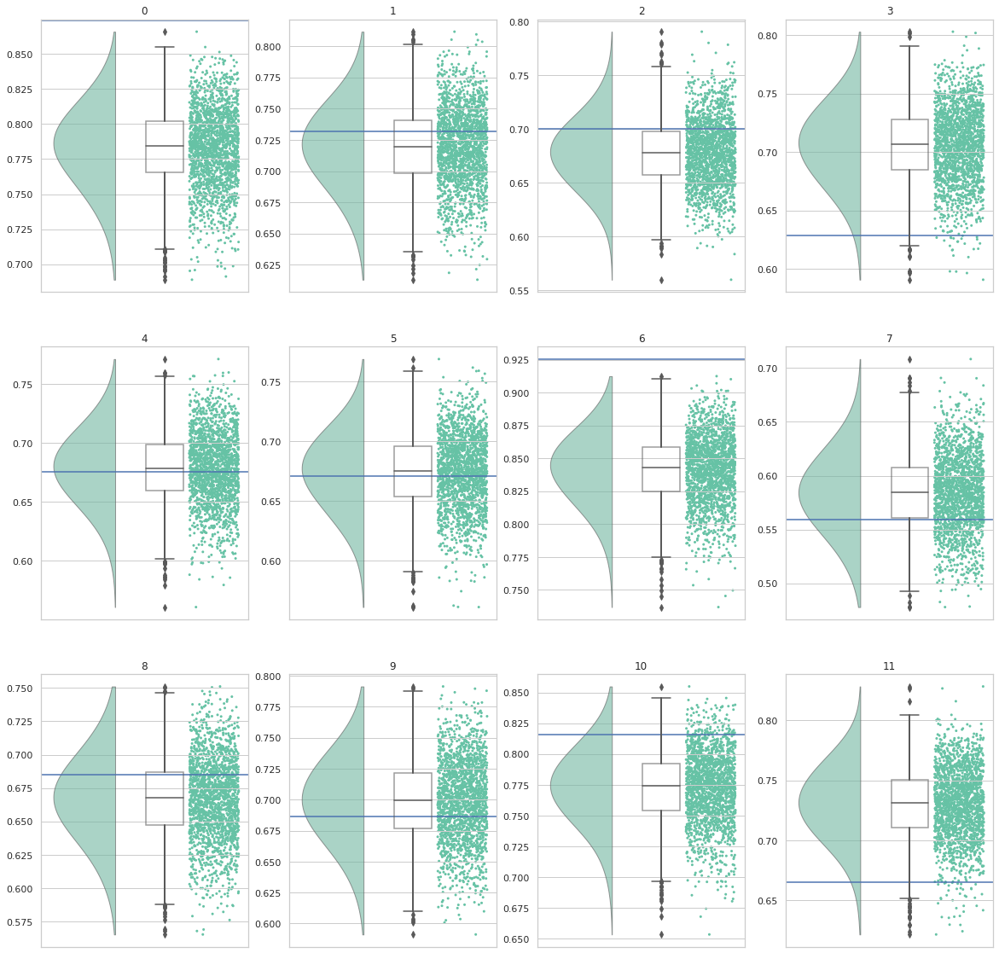

In [155]:
param = 'z'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj_trans.'+ str(i)))
    # ground parameter of subject effect
    spm =  group_params.loc[group_params['subj_idx']==i,'z'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = 1/(1+np.exp(-m1res_trace[varname])), 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

##### t

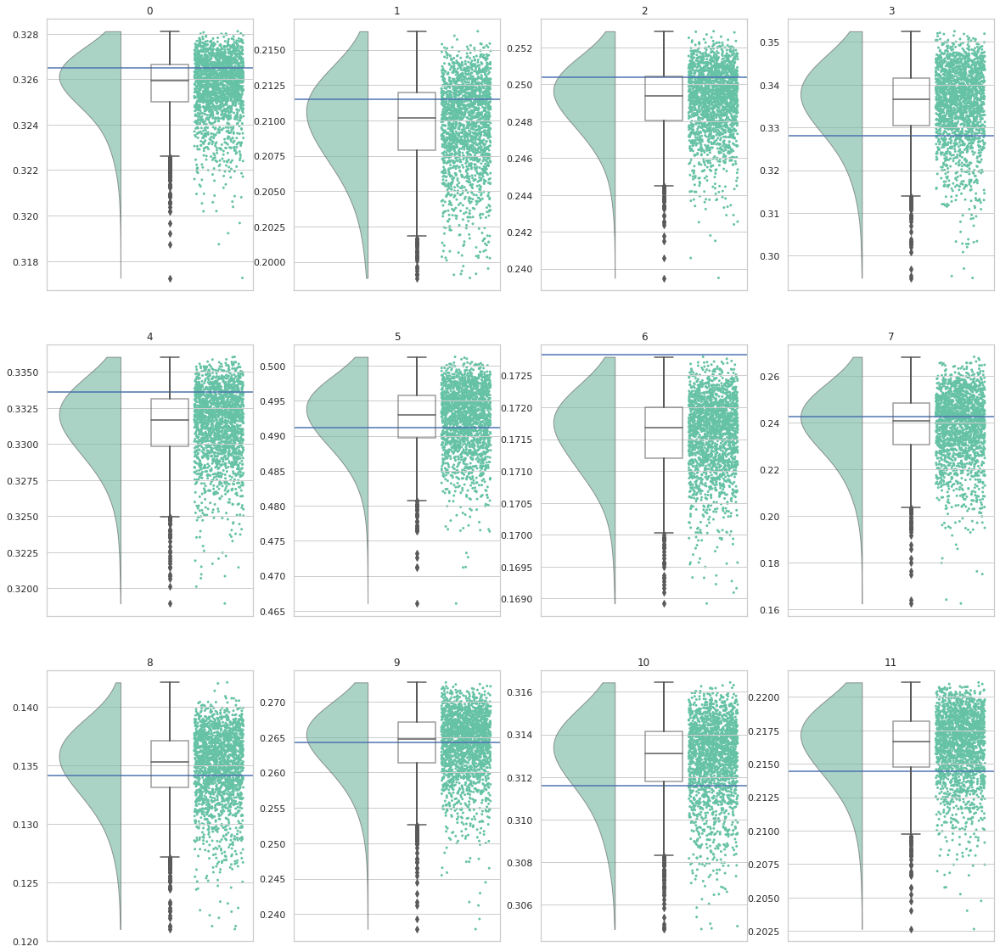

In [156]:
param = 't'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj.'+ str(i)))
    # ground parameter of subject effect
    spm =  group_params.loc[group_params['subj_idx']==i,'t'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = m1res_trace[varname], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

##### a

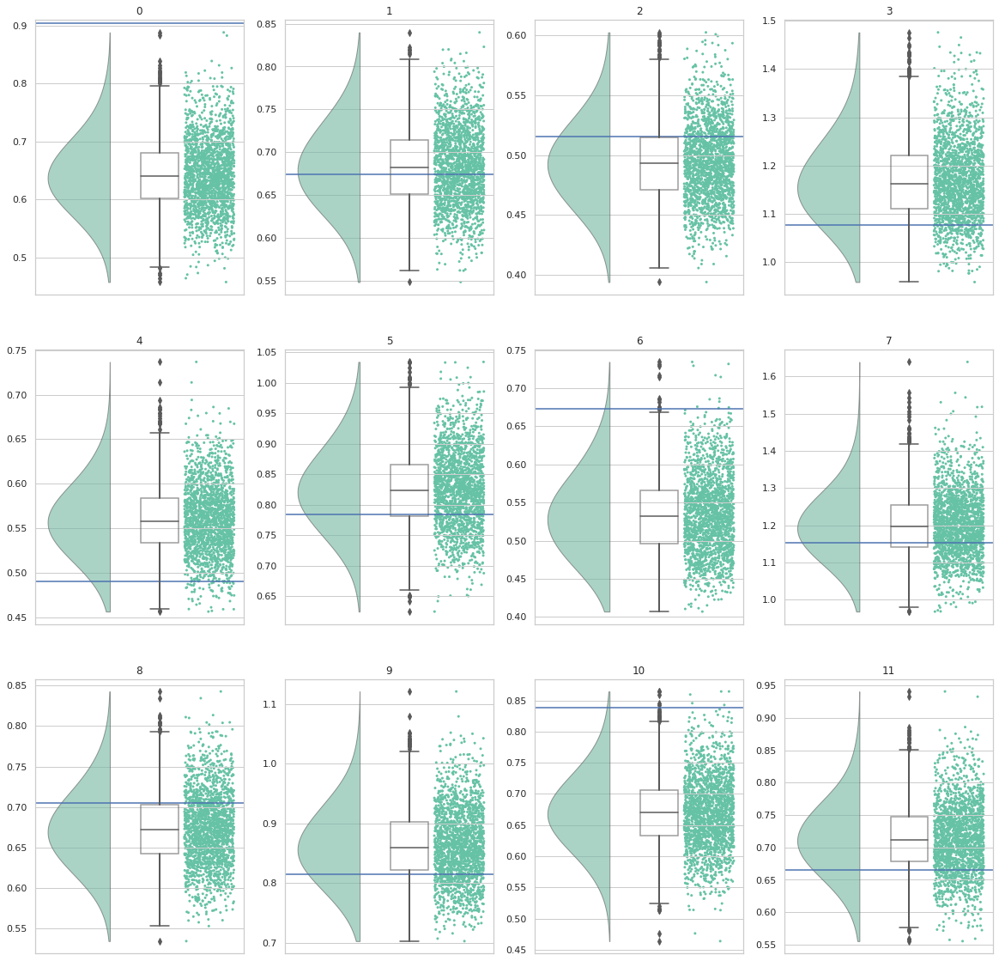

In [157]:
param = 'a'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj.'+ str(i)))
    # ground parameter of subject effect
    spm =  group_params.loc[group_params['subj_idx']==i,'a'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = m1res_trace[varname], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

# stimulus coding, v bias, positive/negative

In this scenario, we assume the stim coding influence the parameter. v for stimA and -v for stimB. Other parameters are same.

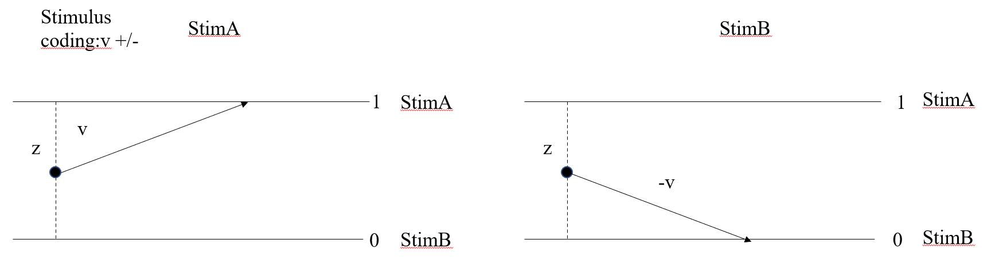

## Generate random parameter and performance

In [158]:
n_subjs=12
n_trials=50
effect=0
n_cond = 1

In [159]:
# set the figure theme
sns.set_theme(style="whitegrid")
# set random seed
np.random.seed(123)

In [160]:
data_stim =[]
group_params_stim =[]


# generate params at population level
params = hddm.generate.gen_rand_params()
params['v_slope'] = effect
params['sv'] = 0

del params['v']
reg_outcomes=['v']
share_noise = ('a','v','t','st','sz','sv','z', 'v_slope', 'v_inter')
group_params=[]

# set valid param ranges
bounds = {'a': (0, np.inf),
          'z': (0, 1),
          't': (0, np.inf), 
          'st': (0, np.inf),
          'sv': (0, np.inf),
          'sz': (0, 1)
}
for i_subj in range(n_subjs):
    for stim in [0,1]:
        # generate params at subject level
        if stim ==0:
            params['v_inter'] = 1
            subj_params_tmp = kabuki.generate._add_noise({'none': params}, 
                                       noise=OrderedDict([('v', 0.2),
                                       ('a', 0.2),
                                       ('t', 0.1),
                                       ('sv', 0.1),
                                        ('z',0.1),
                                       ('v_inter', 0.1)]), 
                                       share_noise=share_noise,
                                                check_valid_func=hddm.utils.check_params_valid,
                                                bounds=bounds,
                                                exclude_params={'reg_outcomes', 'st', 'sv', 'sz'})['none']
            
        else:
            subj_params_tmp['v_inter'] = -subj_params_tmp['v_inter']
            
        #generate v
        wfpt_params = deepcopy(subj_params_tmp)
        wfpt_params.pop('v_inter')
        effect = wfpt_params.pop('v_slope')
        x1 = np.random.randint(2,size=n_trials)
        x1 = np.arange(n_cond)
        wfpt_params['v'] = (effect*x1) + subj_params_tmp['v_inter']

        #generate rt and choice of each trial
        i_params = deepcopy(wfpt_params)
        sampled_rts = pd.DataFrame(np.zeros((n_trials, 2)), columns=['rt', 'response'])
        for i_sample in x1:
            #get current params
            for p in reg_outcomes:
                i_params[p] = wfpt_params[p][i_sample]
            #sample
            sampled_rts.iloc[(0+int(n_trials/n_cond)*i_sample):(int(n_trials/n_cond)+int(n_trials/n_cond)*i_sample),:] = hddm.generate.gen_rts(size=int(n_trials/n_cond), method='drift', dt=1e-3, **i_params).values
        sampled_rts['subj_idx']=i_subj
        sampled_rts['cov']=np.ones(int(n_trials))
        sampled_rts['stim']=stim
        subj_data=sampled_rts

        # create dataframe
        subj_params = pd.DataFrame([subj_params_tmp])
        # add subject
        subj_params['subj_idx'] = i_subj
        subj_params['v']=wfpt_params['v'].mean()
        subj_params['stim']=stim


        # param v
        subj_v = pd.DataFrame({'v':wfpt_params['v'],
                 'cov':x1,
                'subj_idx':i_subj})


        if stim==0:    
            data_stim = subj_data
        else:
            data_stim = pd.concat((data_stim, subj_data), ignore_index=True)
        if stim == 0:
            group_params_stim = subj_params
        else:
            group_params_stim = pd.concat((group_params_stim, subj_params), ignore_index=True)
        
        
        
        
        
    #concatante subj_data to group_data
    if i_subj == 0:
        group_params = group_params_stim
    else:
        group_params = pd.concat((group_params, group_params_stim), ignore_index=True)

    #concatante subj_data to group_data
    if i_subj == 0:
        data = data_stim
    else:
        data = pd.concat((data, data_stim), ignore_index=True)

    #concatante subj_data to group_data
    if i_subj == 0:
        wfpt_v = subj_v
    else:
        wfpt_v = pd.concat((wfpt_v, subj_v), ignore_index=True)  

In [161]:
data

,rt,response,subj_idx,cov,stim
0,0.566818,1.0,0,1.0,0
1,0.388818,1.0,0,1.0,0
2,0.418818,1.0,0,1.0,0
3,0.346818,1.0,0,1.0,0
4,0.534765,0.0,0,1.0,0
...,...,...,...,...,...
1195,0.375464,0.0,11,1.0,1
1196,0.441464,0.0,11,1.0,1
1197,0.625464,0.0,11,1.0,1
1198,0.335464,0.0,11,1.0,1


In [162]:
group_params

,sv,sz,st,z,t,a,v_slope,v_inter,subj_idx,v,stim
0,0,0,0,0.673837,0.326487,0.904698,0,0.994848,0,0.994848,0
1,0,0,0,0.673837,0.326487,0.904698,0,-0.994848,0,-0.994848,1
2,0,0,0,0.498061,0.374610,0.737983,0,0.797353,1,0.797353,0
3,0,0,0,0.498061,0.374610,0.737983,0,-0.797353,1,-0.797353,1
4,0,0,0,0.539892,0.448969,0.953646,0,1.013216,2,1.013216,0
5,0,0,0,0.539892,0.448969,0.953646,0,-1.013216,2,-1.013216,1
6,0,0,0,0.586221,0.313499,0.899741,0,1.155997,3,1.155997,0
7,0,0,0,0.586221,0.313499,0.899741,0,-1.155997,3,-1.155997,1
8,0,0,0,0.443104,0.210643,0.566983,0,1.032698,4,1.032698,0
9,0,0,0,0.443104,0.210643,0.566983,0,-1.032698,4,-1.032698,1


## Visualisation Result

Then, we use raincloud pcture to show the group-level parameters and subject-level parameters as well as the generated data.

In [163]:
param = group_params

In [164]:
# select the specific coloumn
param = param[['v','a','t','z','subj_idx']]
# store the wide data to linear regression
param_pm = param
# wide to long
param = param.melt(id_vars='subj_idx', 
                   var_name='param', 
                   value_name='value' )

In [165]:
group_params

,sv,sz,st,z,t,a,v_slope,v_inter,subj_idx,v,stim
0,0,0,0,0.673837,0.326487,0.904698,0,0.994848,0,0.994848,0
1,0,0,0,0.673837,0.326487,0.904698,0,-0.994848,0,-0.994848,1
2,0,0,0,0.498061,0.374610,0.737983,0,0.797353,1,0.797353,0
3,0,0,0,0.498061,0.374610,0.737983,0,-0.797353,1,-0.797353,1
4,0,0,0,0.539892,0.448969,0.953646,0,1.013216,2,1.013216,0
5,0,0,0,0.539892,0.448969,0.953646,0,-1.013216,2,-1.013216,1
6,0,0,0,0.586221,0.313499,0.899741,0,1.155997,3,1.155997,0
7,0,0,0,0.586221,0.313499,0.899741,0,-1.155997,3,-1.155997,1
8,0,0,0,0.443104,0.210643,0.566983,0,1.032698,4,1.032698,0
9,0,0,0,0.443104,0.210643,0.566983,0,-1.032698,4,-1.032698,1


Text(0.5, 0, 't')

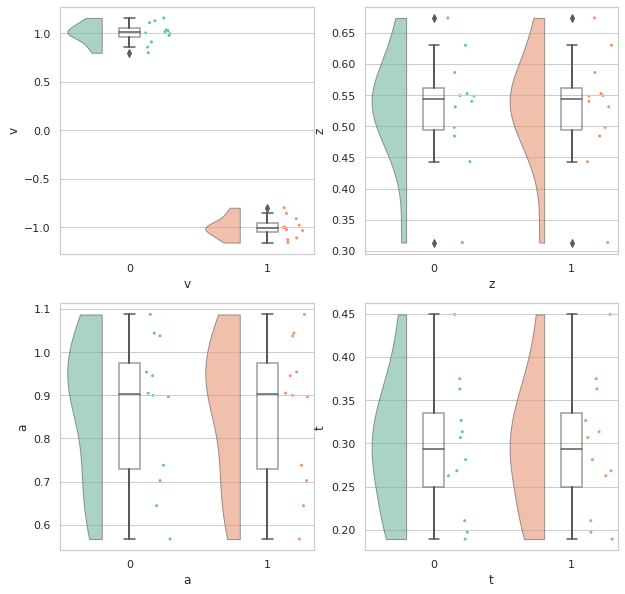

In [166]:
# create figure
f, ax = plt.subplots(2,2,figsize=(10, 10))
# the right figure
# v
ax[0,0]=pt.RainCloud(x = 'stim', 
                  y = 'v', 
                  data = group_params, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[0,0])
ax[0,0].set_xlabel('v')
# z
ax[0,1]=pt.RainCloud(x = 'stim', 
                  y = 'z', 
                  data = group_params, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[0,1])
ax[0,1].set_xlabel('z')
# a
ax[1,0]=pt.RainCloud(x = 'stim', 
                  y = 'a', 
                  data = group_params, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[1,0])
ax[1,0].set_xlabel('a')
# t
ax[1,1]=pt.RainCloud(x = 'stim', 
                  y = 't', 
                  data = group_params, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[1,1])
ax[1,1].set_xlabel('t')


<AxesSubplot:xlabel='response', ylabel='rt'>

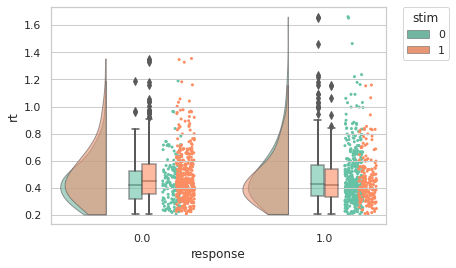

In [167]:
# the rt distribution
pt.RainCloud(x = 'response', 
                  y = 'rt', 
                 hue = 'stim',
                  data = data, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2)

## Constructing the model and fitting it


Because we only assignate the effcet into parameter v, so our model only have one parameter vary with the covariance.

In [168]:
def v_link_func(x, data=data):
    stim = (np.asarray(dmatrix('0 + C(s, [[0], [1]])',
                              {'s': data.stim.loc[x.index]},return_type='dataframe'))
    )
    v_flip = x.to_frame()
    v_flip[stim == 1] *= -1
    return v_flip

In [169]:
m = hddm.HDDMRegressor(data, 
                       ['z~1',{'model':'v~1','link_func':v_link_func},'a~1','t~1'],
                       include=['z'],
                       group_only_regressors=False,
                       keep_regressor_trace=True,
                      )
m.sample(3000,burn=1000)

Adding these covariates:
['z_Intercept']
Adding these covariates:
['v_Intercept']
Adding these covariates:
['a_Intercept']
Adding these covariates:
['t_Intercept']
 [-----------------100%-----------------] 3001 of 3000 complete in 1579.5 sec

### Inspect the trace

Plotting z_Intercept
Plotting z_Intercept_std
Plotting v_Intercept
Plotting v_Intercept_std
Plotting a_Intercept
Plotting a_Intercept_std
Plotting t_Intercept
Plotting t_Intercept_std


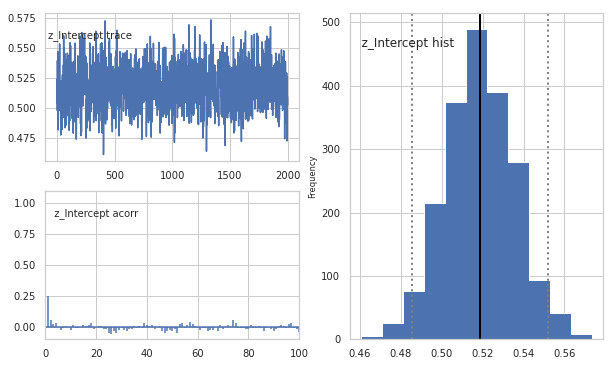

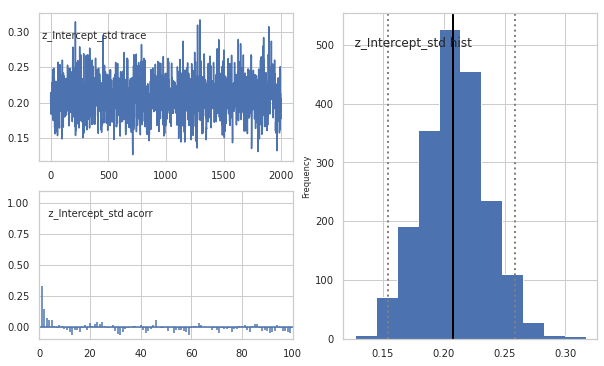

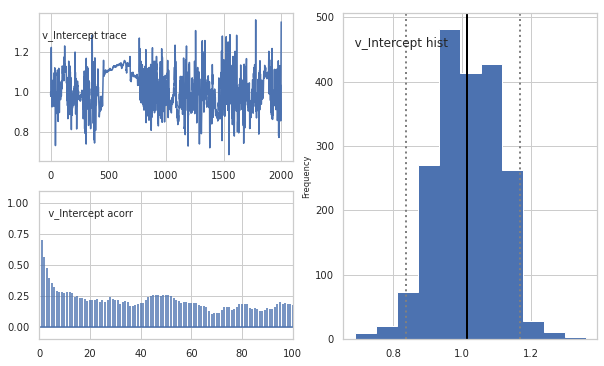

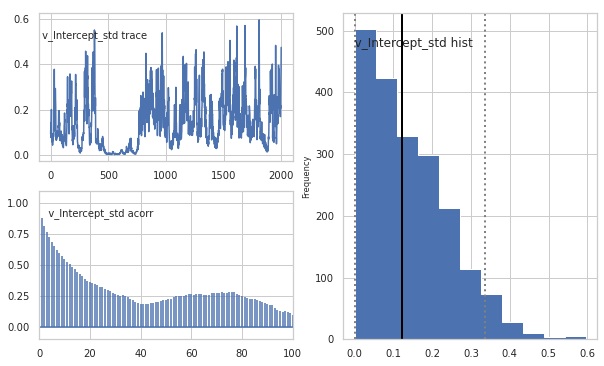

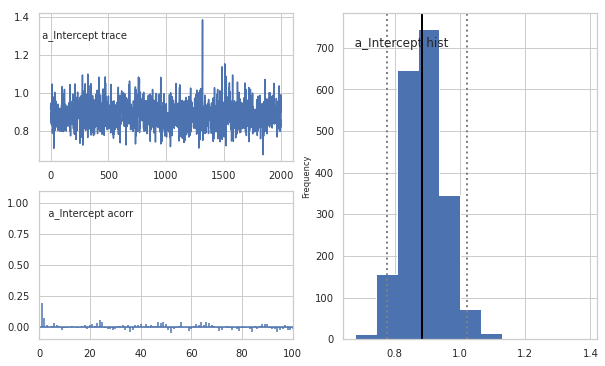

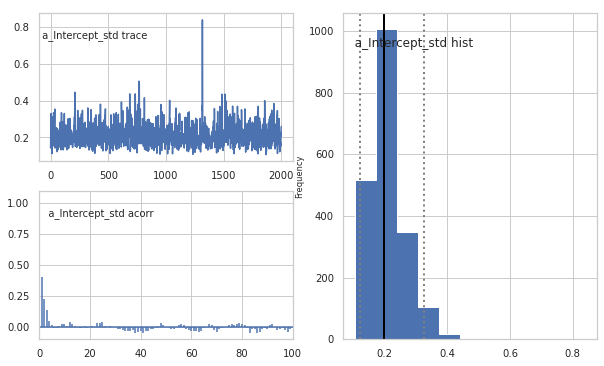

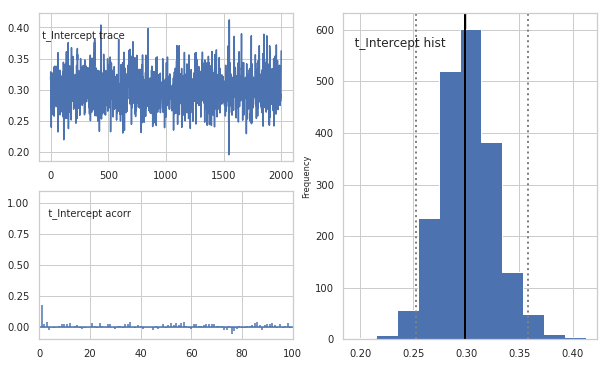

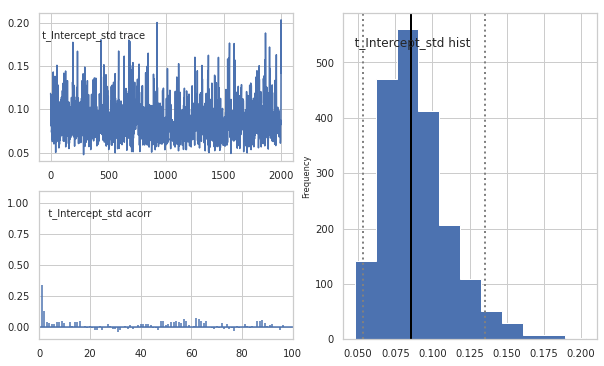

In [170]:
m.plot_posteriors()

Inspect the trace of each paramter, the sample of them is close to Convergence.

In [171]:
m.get_traces().to_csv('mres4.csv')

In [172]:
m1res_trace = pd.read_csv('mres4.csv')

### Inspect the results

After the sample of trace has convergened, we should check whether the value of parameter estimated by the model is similar to the value we set.

#### group-level params

In [173]:
params

{'sv': 0,
 'sz': 0,
 'st': 0,
 'z': 0.5,
 't': 0.2858418004851139,
 'a': 0.8402771803463047,
 'v_slope': 0,
 'v_inter': 1}

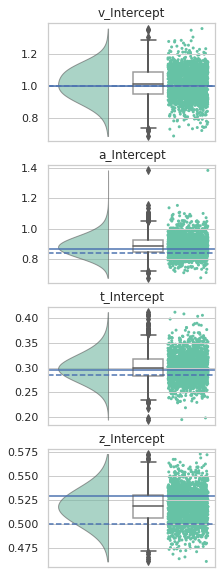

In [174]:
pms = ['v_Intercept','a_Intercept','t_Intercept','z_Intercept']
# create figure
f,ax = plt.subplots(4,figsize=(3,10))
for i,pm in enumerate(pms):
    if pm == 'a_Intercept' :
        varname = os.path.join(str(pm))
        data = m1res_trace[varname]
        # ground parameter of group effect
        gpm = group_params['a'].mean()
        gpm_g = params['a']
    elif pm == 'v_Intercept':
        varname = os.path.join(str(pm ))
        data = m1res_trace[varname]
        gpm=group_params.loc[group_params['stim']==0,'v'].mean()
        gpm_g = params['v_inter']
    elif pm == 't_Intercept':
        varname = os.path.join(str(pm ))
        data = m1res_trace[varname]
        gpm=group_params['t'].mean()
        gpm_g = params['t']
    elif pm == 'z_Intercept':
        varname = os.path.join(str(pm +'_trans'))
        data = 1/(1+np.exp(-m1res_trace[varname]))
        gpm=group_params['z'].mean()
        gpm_g = params['z']
    
    # raincloud
    ax_i = pt.RainCloud(data = data, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax[i])
    ax_i.axhline(gpm)
    ax_i.axhline(gpm_g, ls='--')
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(pm)

The dash line represent the group level parameter we set, the solid line is the mean of subject parameters.

We can see the mean of estimated parameters is close to the true parameter. The result of parameter recovery of group-level is acceptable.

#### subject-level params

##### v

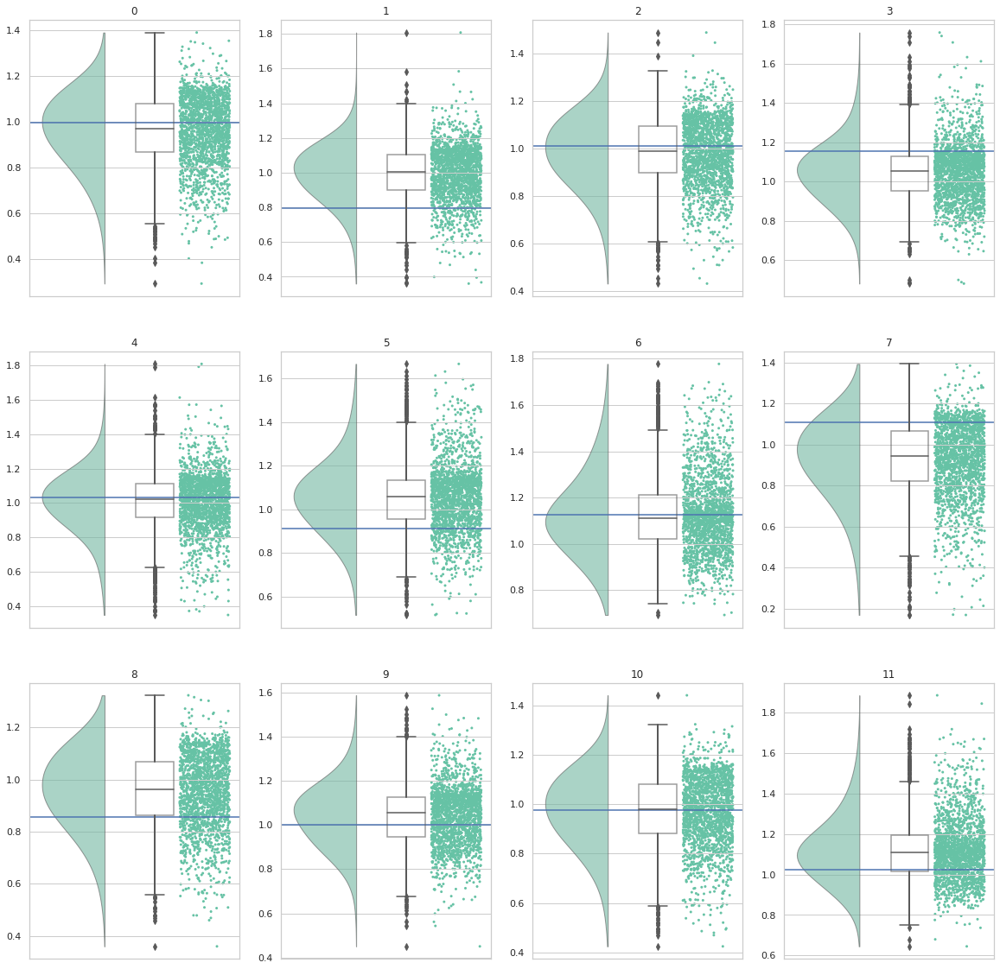

In [175]:
param = 'v'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj.'+ str(i)))
    # ground parameter of subject effect
    spm =  group_params.loc[group_params['subj_idx']==i,'v'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = m1res_trace[varname], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

##### z

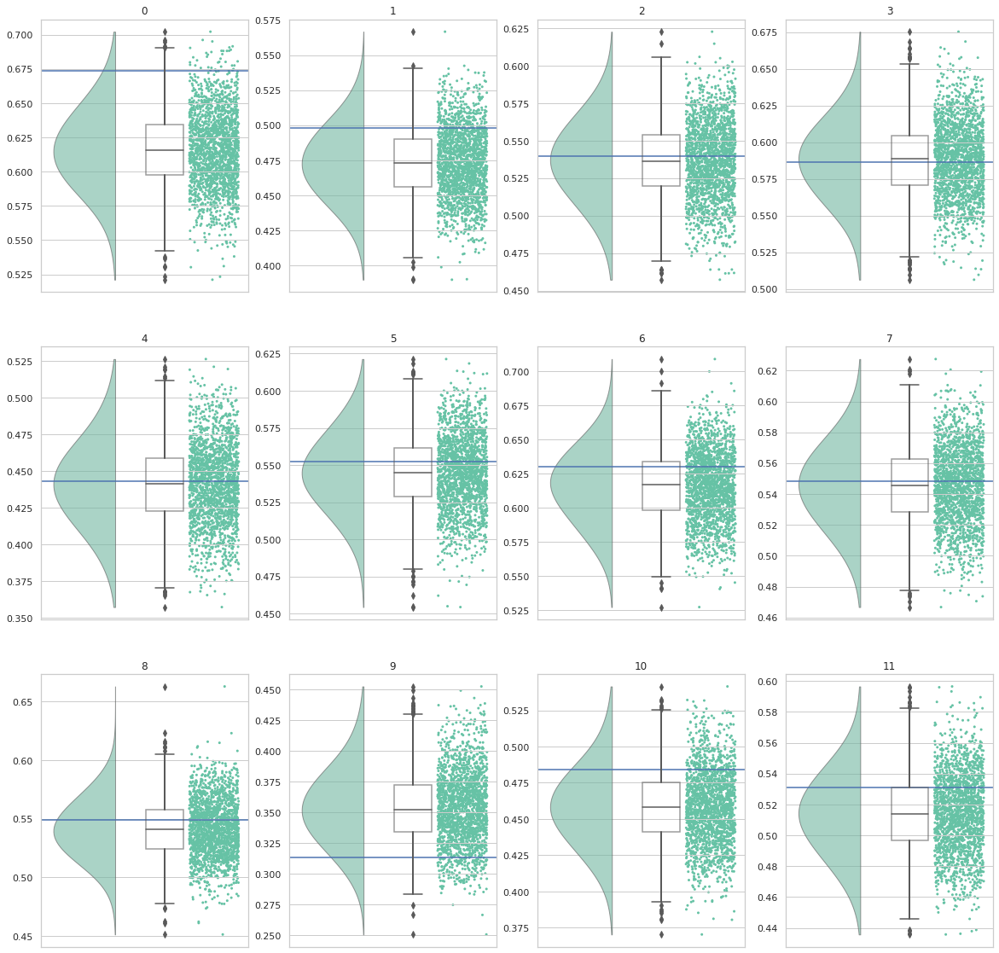

In [176]:
param = 'z'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj_trans.'+ str(i)))
    # ground parameter of subject effect
    spm =  group_params.loc[group_params['subj_idx']==i,'z'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = 1/(1+np.exp(-m1res_trace[varname])), 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

##### t

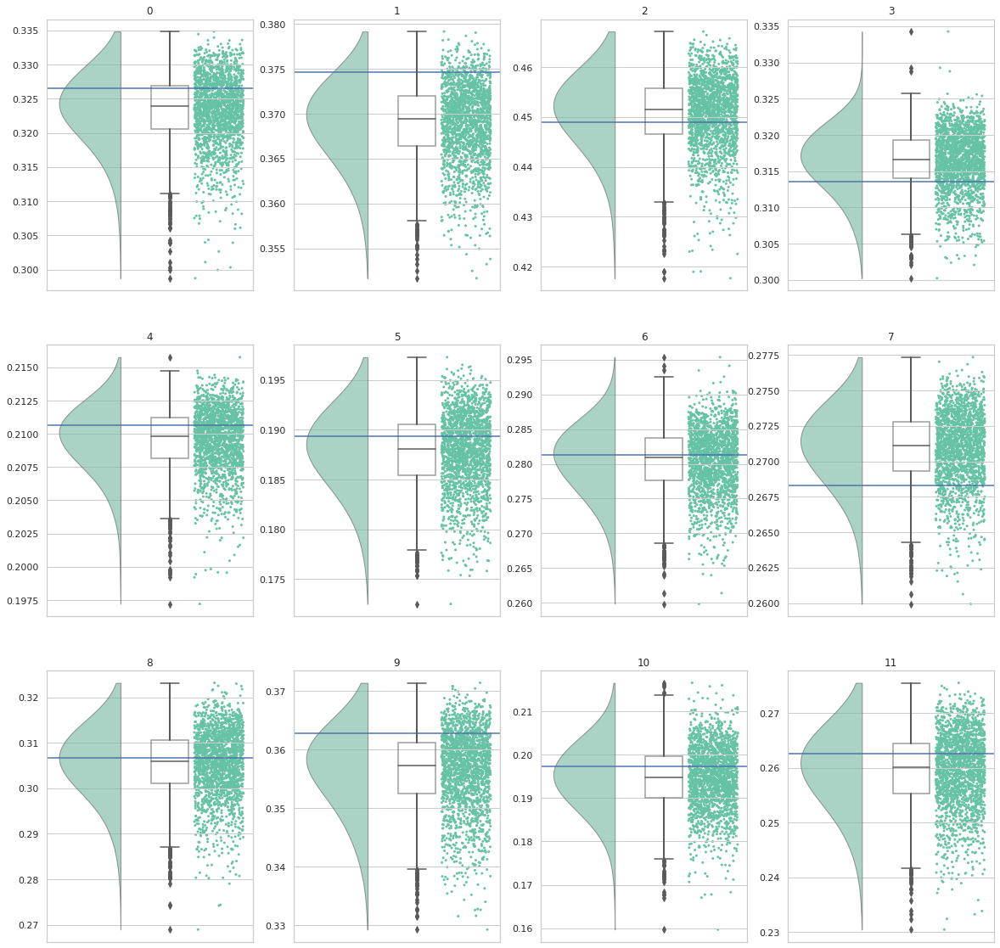

In [177]:
param = 't'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj.'+ str(i)))
    # ground parameter of subject effect
    spm =  group_params.loc[group_params['subj_idx']==i,'t'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = m1res_trace[varname], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

##### a

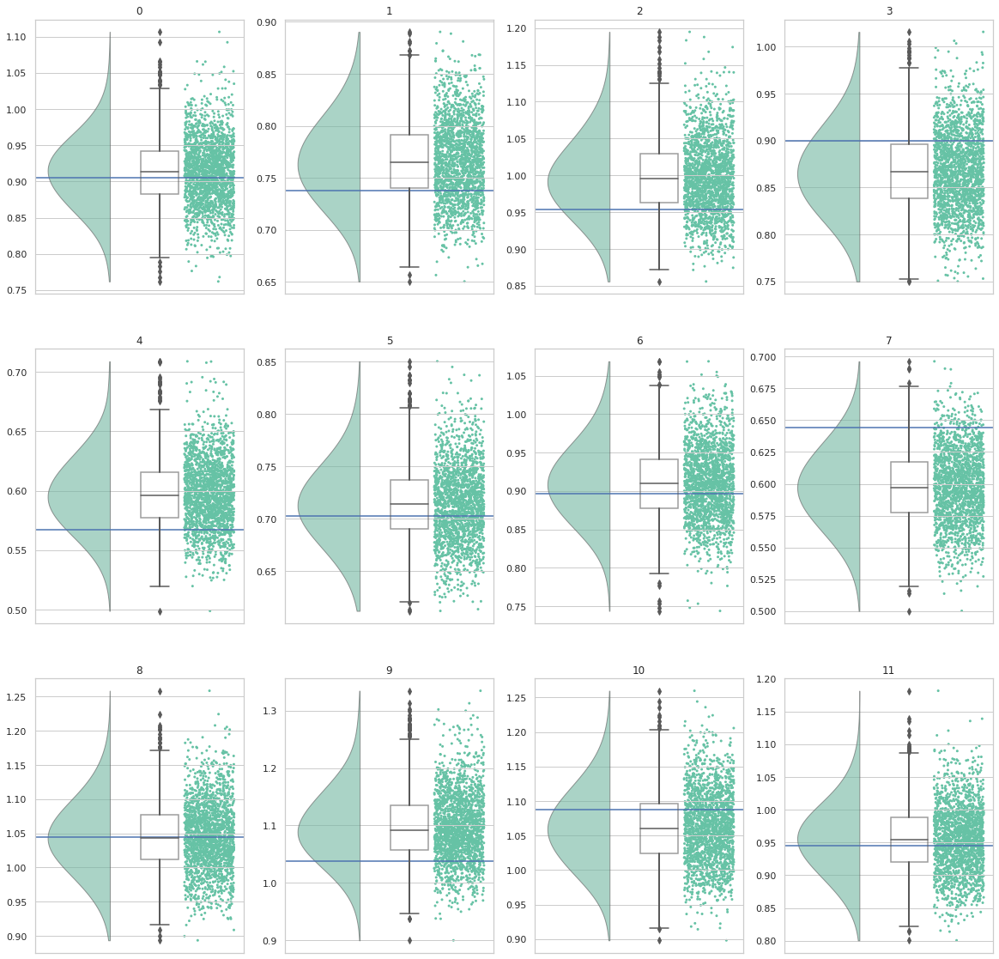

In [178]:
param = 'a'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj.'+ str(i)))
    # ground parameter of subject effect
    spm =  group_params.loc[group_params['subj_idx']==i,'a'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = m1res_trace[varname], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

# stimulus coding, v bias, dc

In this scenario, we assume the stim coding influence the parameter. v+dc for stimA and -v+dc for stimB. Other parameters are same.

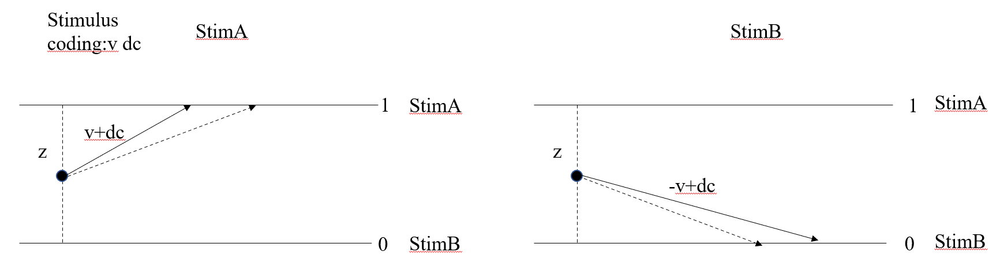

## Generate random parameter and performance

In [179]:
n_subjs=12
n_trials=50
effect=0
n_cond = 1

In [180]:
# set the figure theme
sns.set_theme(style="whitegrid")
# set random seed
np.random.seed(123)

In [181]:
data_stim =[]
group_params_stim =[]


# generate params at population level
params = hddm.generate.gen_rand_params()
params['v_slope'] = effect
params['sv'] = 0

del params['v']
reg_outcomes=['v']
share_noise = ('a','v','t','st','sz','sv','z', 'v_slope', 'v_inter')
group_params=[]

# set valid param ranges
bounds = {'a': (0, np.inf),
          'z': (0, 1),
          't': (0, np.inf), 
          'st': (0, np.inf),
          'sv': (0, np.inf),
          'sz': (0, 1)
}
for i_subj in range(n_subjs):
    for stim in [0,1]:
        # generate params at subject level
        if stim ==0:
            params['v_inter'] = 1
            dc = 0.5
            subj_params_tmp = kabuki.generate._add_noise({'none': params}, 
                                       noise=OrderedDict([('v', 0.2),
                                       ('a', 0.2),
                                       ('t', 0.1),
                                       ('sv', 0.1),
                                        ('z',0.1),
                                       ('v_inter', 0.1)]), 
                                       share_noise=share_noise,
                                                check_valid_func=hddm.utils.check_params_valid,
                                                bounds=bounds,
                                                exclude_params={'reg_outcomes', 'st', 'sv', 'sz'})['none']
            
            subj_params_tmp['v_inter'] = subj_params_tmp['v_inter']+dc
        else:
            subj_params_tmp['v_inter'] = 2*dc - subj_params_tmp['v_inter']
            
        #generate v
        wfpt_params = deepcopy(subj_params_tmp)
        wfpt_params.pop('v_inter')
        effect = wfpt_params.pop('v_slope')
        x1 = np.random.randint(2,size=n_trials)
        x1 = np.arange(n_cond)
        wfpt_params['v'] = (effect*x1) + subj_params_tmp['v_inter']

        #generate rt and choice of each trial
        i_params = deepcopy(wfpt_params)
        sampled_rts = pd.DataFrame(np.zeros((n_trials, 2)), columns=['rt', 'response'])
        for i_sample in x1:
            #get current params
            for p in reg_outcomes:
                i_params[p] = wfpt_params[p][i_sample]
            #sample
            sampled_rts.iloc[(0+int(n_trials/n_cond)*i_sample):(int(n_trials/n_cond)+int(n_trials/n_cond)*i_sample),:] = hddm.generate.gen_rts(size=int(n_trials/n_cond), method='drift', dt=1e-3, **i_params).values
        sampled_rts['subj_idx']=i_subj
        sampled_rts['cov']=np.ones(int(n_trials))
        sampled_rts['stim']=stim
        subj_data=sampled_rts

        # create dataframe
        subj_params = pd.DataFrame([subj_params_tmp])
        # add subject
        subj_params['subj_idx'] = i_subj
        subj_params['v']=wfpt_params['v'].mean()
        subj_params['stim']=stim


        # param v
        subj_v = pd.DataFrame({'v':wfpt_params['v'],
                 'cov':x1,
                'subj_idx':i_subj})


        if stim==0:    
            data_stim = subj_data
        else:
            data_stim = pd.concat((data_stim, subj_data), ignore_index=True)
        if stim == 0:
            group_params_stim = subj_params
        else:
            group_params_stim = pd.concat((group_params_stim, subj_params), ignore_index=True)
        
        
        
        
        
    #concatante subj_data to group_data
    if i_subj == 0:
        group_params = group_params_stim
    else:
        group_params = pd.concat((group_params, group_params_stim), ignore_index=True)

    #concatante subj_data to group_data
    if i_subj == 0:
        data = data_stim
    else:
        data = pd.concat((data, data_stim), ignore_index=True)

    #concatante subj_data to group_data
    if i_subj == 0:
        wfpt_v = subj_v
    else:
        wfpt_v = pd.concat((wfpt_v, subj_v), ignore_index=True)  

In [182]:
data

,rt,response,subj_idx,cov,stim
0,0.554818,1.0,0,1.0,0
1,0.386818,1.0,0,1.0,0
2,0.418818,1.0,0,1.0,0
3,0.346818,1.0,0,1.0,0
4,0.670818,1.0,0,1.0,0
...,...,...,...,...,...
1195,0.140055,0.0,11,1.0,1
1196,0.144055,0.0,11,1.0,1
1197,0.154055,0.0,11,1.0,1
1198,0.564220,1.0,11,1.0,1


In [183]:
group_params

,sv,sz,st,z,t,a,v_slope,v_inter,subj_idx,v,stim
0,0,0,0,0.673837,0.326487,0.904698,0,1.494848,0,1.494848,0
1,0,0,0,0.673837,0.326487,0.904698,0,-0.494848,0,-0.494848,1
2,0,0,0,0.498061,0.374610,0.737983,0,1.297353,1,1.297353,0
3,0,0,0,0.498061,0.374610,0.737983,0,-0.297353,1,-0.297353,1
4,0,0,0,0.539892,0.448969,0.953646,0,1.513216,2,1.513216,0
5,0,0,0,0.539892,0.448969,0.953646,0,-0.513216,2,-0.513216,1
6,0,0,0,0.559742,0.341447,0.650320,0,1.640675,3,1.640675,0
7,0,0,0,0.559742,0.341447,0.650320,0,-0.640675,3,-0.640675,1
8,0,0,0,0.358142,0.142329,0.844240,0,1.415874,4,1.415874,0
9,0,0,0,0.358142,0.142329,0.844240,0,-0.415874,4,-0.415874,1


## Visualisation Result

Then, we use raincloud pcture to show the group-level parameters and subject-level parameters as well as the generated data.

In [184]:
param = group_params

In [185]:
# select the specific coloumn
param = param[['v','a','t','z','subj_idx']]
# store the wide data to linear regression
param_pm = param
# wide to long
param = param.melt(id_vars='subj_idx', 
                   var_name='param', 
                   value_name='value' )

Text(0.5, 0, 't')

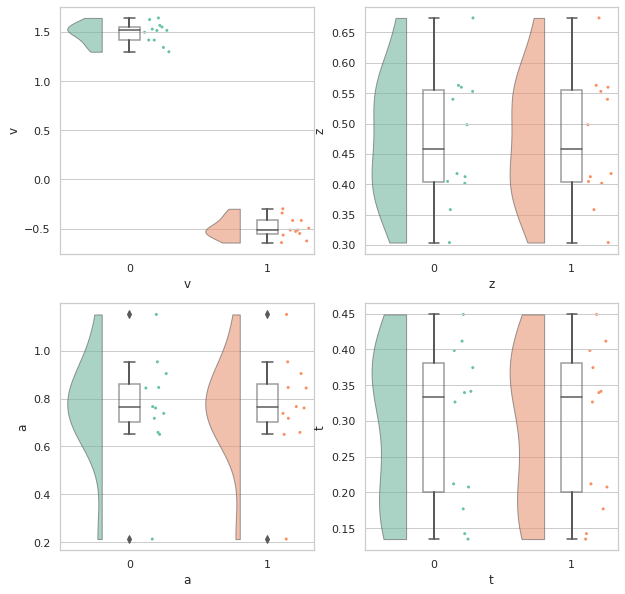

In [186]:
# create figure
f, ax = plt.subplots(2,2,figsize=(10, 10))
# the right figure
# v
ax[0,0]=pt.RainCloud(x = 'stim', 
                  y = 'v', 
                  data = group_params, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[0,0])
ax[0,0].set_xlabel('v')
# z
ax[0,1]=pt.RainCloud(x = 'stim', 
                  y = 'z', 
                  data = group_params, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[0,1])
ax[0,1].set_xlabel('z')
# a
ax[1,0]=pt.RainCloud(x = 'stim', 
                  y = 'a', 
                  data = group_params, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[1,0])
ax[1,0].set_xlabel('a')
# t
ax[1,1]=pt.RainCloud(x = 'stim', 
                  y = 't', 
                  data = group_params, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax=ax[1,1])
ax[1,1].set_xlabel('t')

In [187]:
print('the mean of parameter z is {:.3f} and the std is {:.3f} '.format(param_pm.z.mean(), param_pm.z.std()))
print('the mean of parameter v is {:.3f} and the std is {:.3f} '.format(group_params_stim.loc[group_params_stim['stim']==0,'v'].mean(), group_params_stim.loc[group_params_stim['stim']==0,'v'].std()))
print('the mean of parameter v is {:.3f} and the std is {:.3f} '.format(group_params_stim.loc[group_params_stim['stim']==1,'v'].mean(), group_params_stim.loc[group_params_stim['stim']==1,'v'].std()))
print('the mean of parameter a is {:.3f} and the std is {:.3f} '.format(param_pm.a.mean(), param_pm.a.std()))
print('the mean of parameter t is {:.3f} and the std is {:.3f} '.format(param_pm.t.mean(), param_pm.t.std()))

the mean of parameter z is 0.474 and the std is 0.105 
the mean of parameter v is 1.624 and the std is nan 
the mean of parameter v is -0.624 and the std is nan 
the mean of parameter a is 0.767 and the std is 0.219 
the mean of parameter t is 0.293 and the std is 0.109 


<AxesSubplot:xlabel='response', ylabel='rt'>

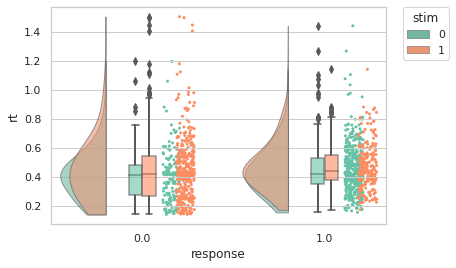

In [188]:
# the rt distribution
pt.RainCloud(x = 'response', 
                  y = 'rt', 
                 hue = 'stim',
                  data = data, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2)

## Constructing the model and fitting it


Because we only assignate the effcet into parameter v, so our model only have one parameter vary with the covariance.

Due to dc is a freedom parameter, we cannot use link function to transform, so we try to add a term of stim in linear regressor. $v \sim 1+stim$

we recode the stim as 1 and -1, and use link function.

for stim = 1, $v \sim \beta_0+\beta_1$

for stim = -1, $v \sim \beta_0-\beta_1$, after link function, it is $-\beta_0 + \beta_1$

$\beta_1$ is dc

In [189]:
data

,rt,response,subj_idx,cov,stim
0,0.554818,1.0,0,1.0,0
1,0.386818,1.0,0,1.0,0
2,0.418818,1.0,0,1.0,0
3,0.346818,1.0,0,1.0,0
4,0.670818,1.0,0,1.0,0
...,...,...,...,...,...
1195,0.140055,0.0,11,1.0,1
1196,0.144055,0.0,11,1.0,1
1197,0.154055,0.0,11,1.0,1
1198,0.564220,1.0,11,1.0,1


In [190]:
data.stim = np.asarray(dmatrix('0 + C(s, [[1], [-1]])',
                              {'s': data.stim.loc[data.rt.index]},return_type='dataframe'))

In [191]:
def v_link_func(x, data=data):
    stim = (np.asarray(dmatrix('0 + C(s, [[1], [-1]])',
                              {'s': data.stim.loc[x.index]},return_type='dataframe'))
    )
    return x.to_frame()*stim

In [192]:
m = hddm.HDDMRegressor(data, 
                       ['z~1',{'model':'v~1+stim','link_func':v_link_func},'a~1','t~1'],
                       include=['z'],
                       group_only_regressors=False,
                       keep_regressor_trace=True,
                      )
m.sample(3000,burn=1000)

Adding these covariates:
['z_Intercept']
Adding these covariates:
['v_Intercept', 'v_stim']
Adding these covariates:
['a_Intercept']
Adding these covariates:
['t_Intercept']
 [-----------------100%-----------------] 3001 of 3000 complete in 2459.2 sec

### Inspect the trace

Plotting z_Intercept
Plotting z_Intercept_std
Plotting v_Intercept
Plotting v_Intercept_std
Plotting v_stim
Plotting v_stim_std
Plotting a_Intercept
Plotting a_Intercept_std
Plotting t_Intercept
Plotting t_Intercept_std


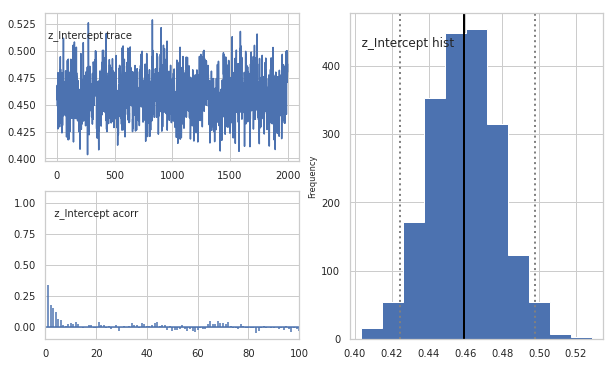

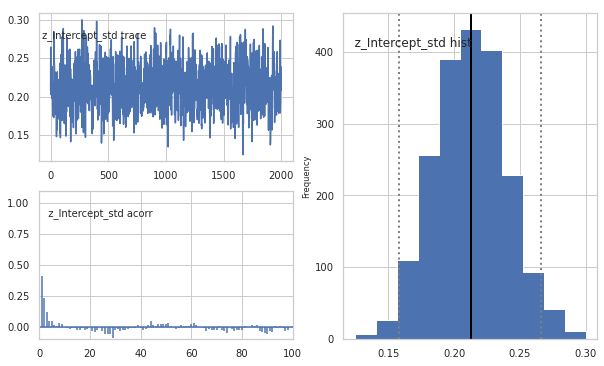

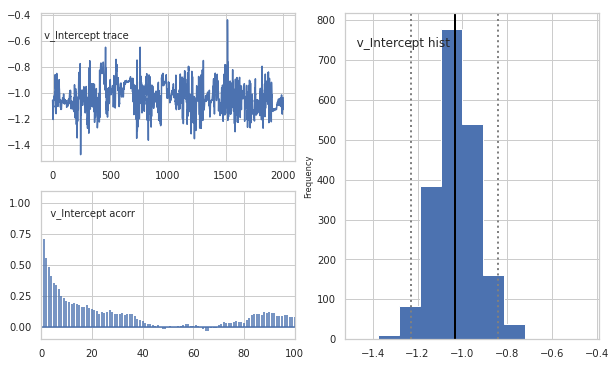

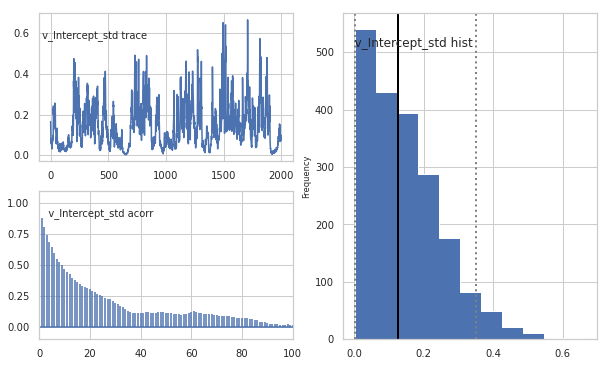

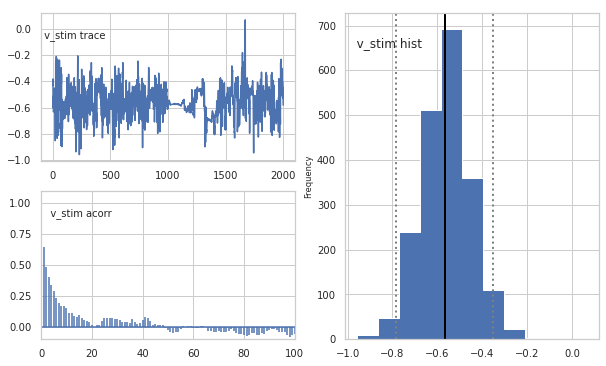

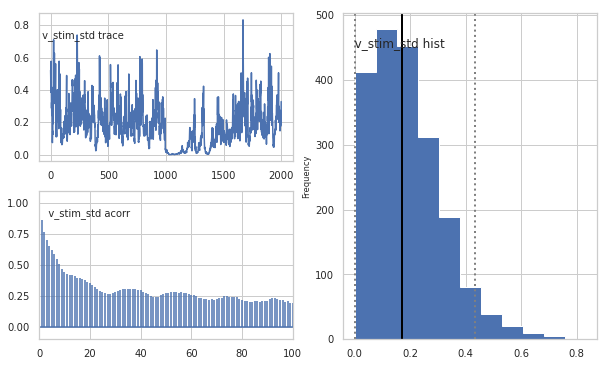

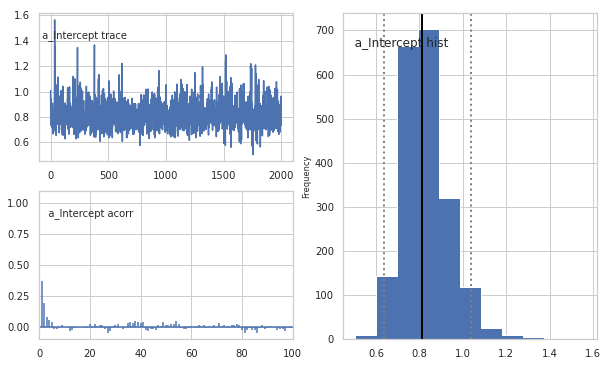

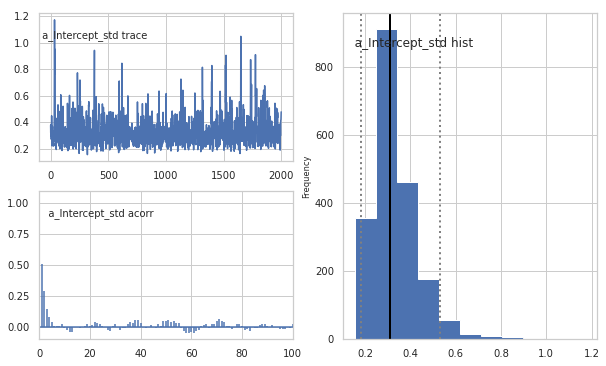

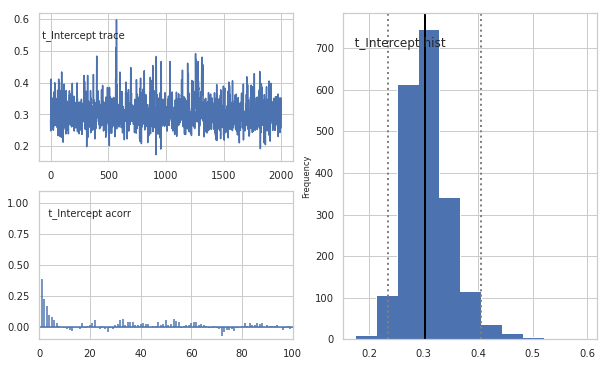

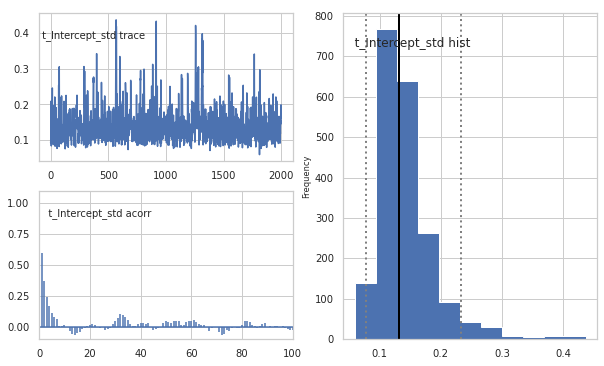

In [193]:
m.plot_posteriors()

Inspect the trace of each paramter, the sample of them is close to Convergence.

In [194]:
m.get_traces().to_csv('mres5.csv')

In [195]:
m1res_trace = pd.read_csv('mres5.csv')

### Inspect the results

After the sample of trace has convergened, we should check whether the value of parameter estimated by the model is similar to the value we set.

#### group-level params

In [196]:
params

{'sv': 0,
 'sz': 0,
 'st': 0,
 'z': 0.5,
 't': 0.2858418004851139,
 'a': 0.8402771803463047,
 'v_slope': 0,
 'v_inter': 1}

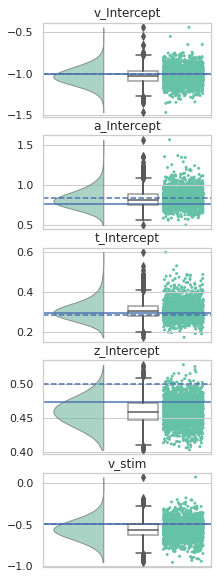

In [197]:
pms = ['v_Intercept','a_Intercept','t_Intercept','z_Intercept','v_stim']
# create figure
f,ax = plt.subplots(5,figsize=(3,10))
for i,pm in enumerate(pms):
    if pm == 'a_Intercept' :
        varname = os.path.join(str(pm))
        data = m1res_trace[varname]
        # ground parameter of group effect
        gpm = group_params['a'].mean()
        gpm_g = params['a']
    elif pm == 'v_Intercept':
        varname = os.path.join(str(pm ))
        data = m1res_trace[varname]
        gpm=-group_params.loc[group_params['stim']==1,'v'].mean()-1.5
        gpm_g = -1
    elif pm == 't_Intercept':
        varname = os.path.join(str(pm ))
        data = m1res_trace[varname]
        gpm=group_params['t'].mean()
        gpm_g = params['t']
    elif pm == 'z_Intercept':
        varname = os.path.join(str(pm +'_trans'))
        data = 1/(1+np.exp(-m1res_trace[varname]))
        gpm=group_params['z'].mean()
        gpm_g = params['z']
    elif pm == 'v_stim':
        varname = os.path.join(str(pm ))
        data = m1res_trace[varname]
        gpm=-0.5
        gpm_g = -0.5
    
    # raincloud
    ax_i = pt.RainCloud(data = data, 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax[i])
    ax_i.axhline(gpm)
    ax_i.axhline(gpm_g, ls='--')
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(pm)

The dash line represent the group level parameter we set, the solid line is the mean of subject parameters.

We can see the mean of estimated parameters is close to the true parameter. The result of parameter recovery of group-level is acceptable.

#### subject-level params

##### v

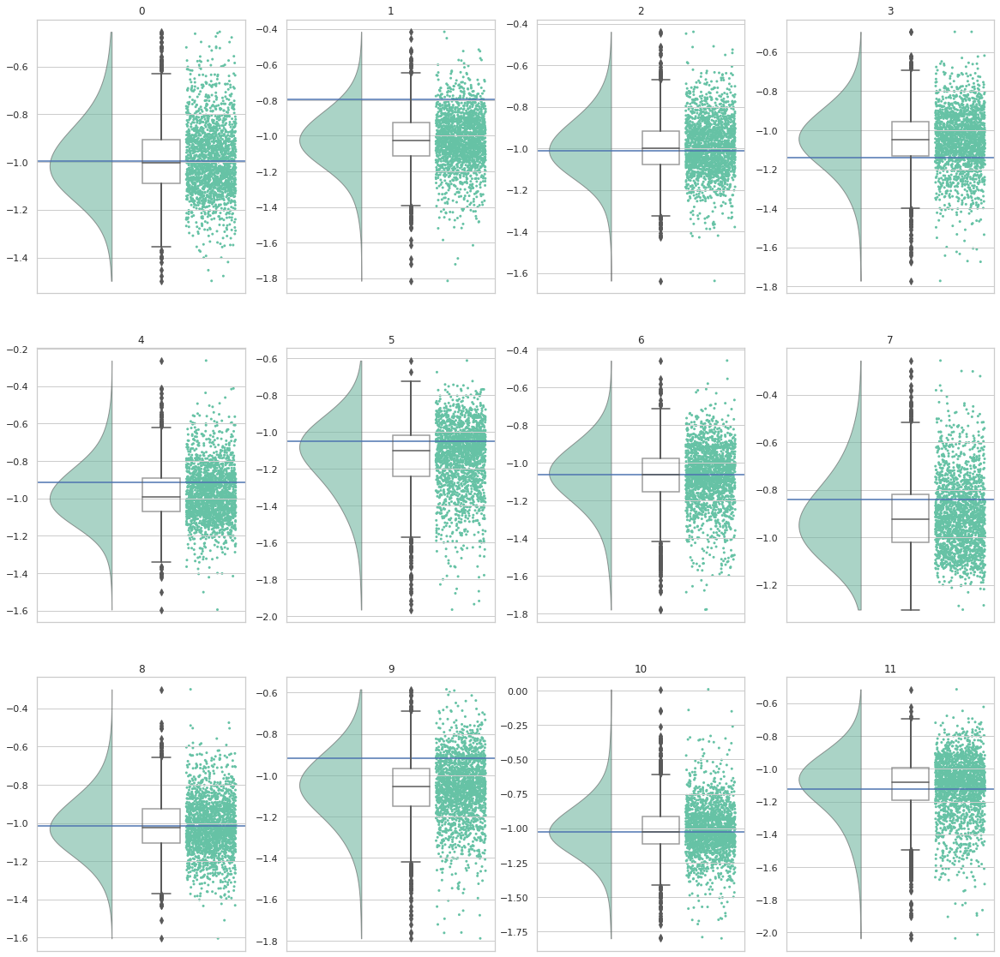

In [198]:
param = 'v'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj.'+ str(i)))
    # ground parameter of subject effect
    spm =  -group_params.loc[group_params['subj_idx']==i,'v'].values[0]+0.5
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = m1res_trace[varname], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

##### vbias

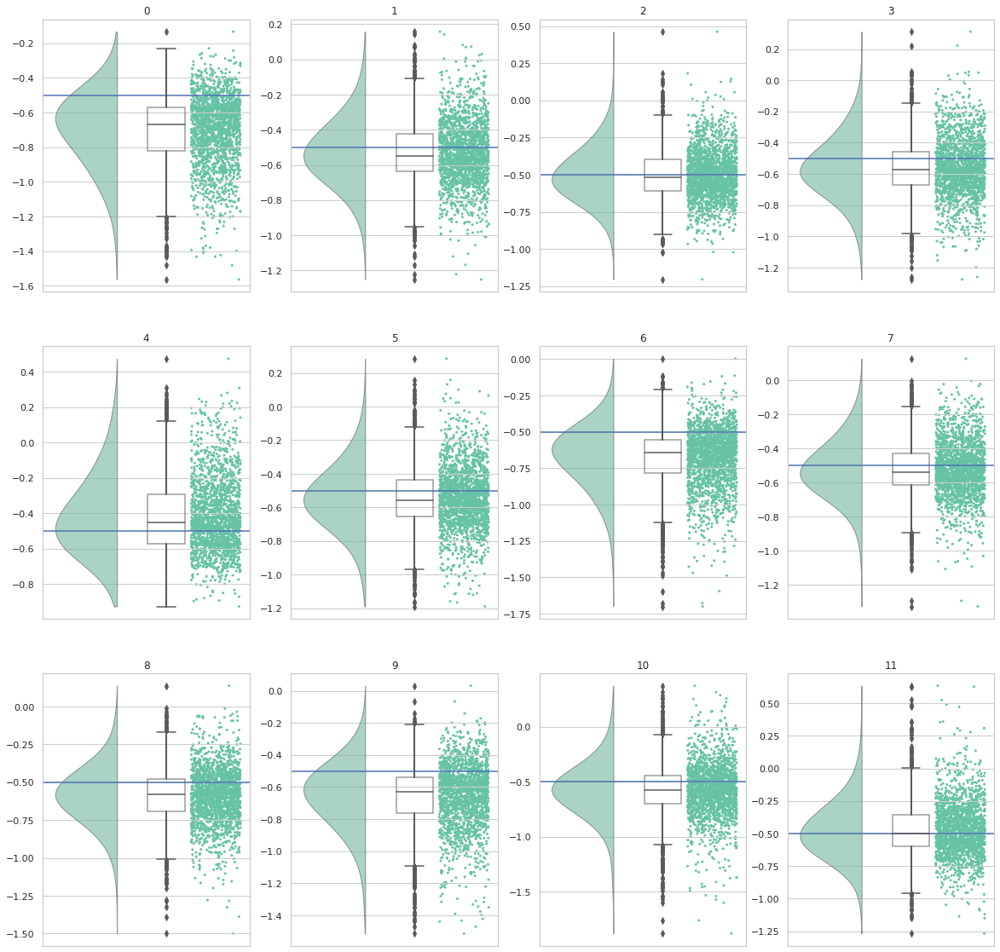

In [199]:
param = 'v'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_stim_subj.'+ str(i)))
    # ground parameter of subject effect
    spm =  -0.5
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = m1res_trace[varname], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

##### z

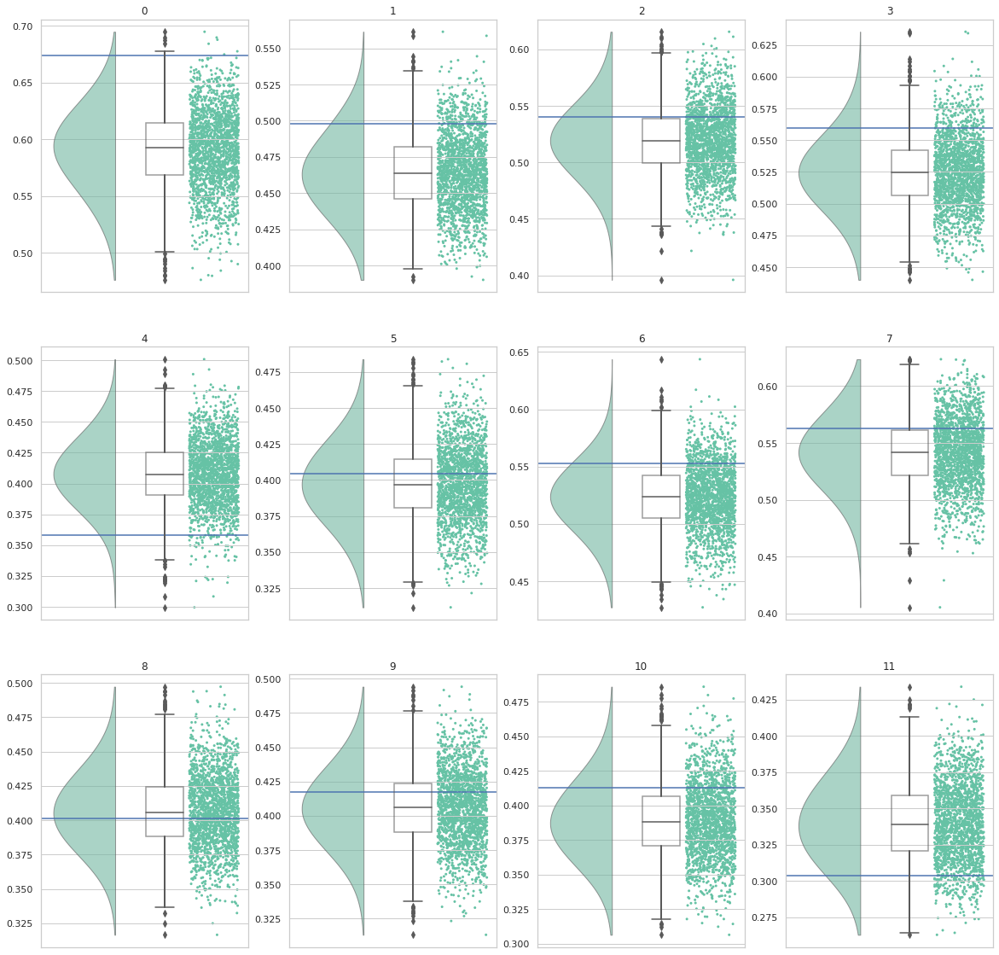

In [200]:
param = 'z'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj_trans.'+ str(i)))
    # ground parameter of subject effect
    spm =  group_params.loc[group_params['subj_idx']==i,'z'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = 1/(1+np.exp(-m1res_trace[varname])), 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

##### t

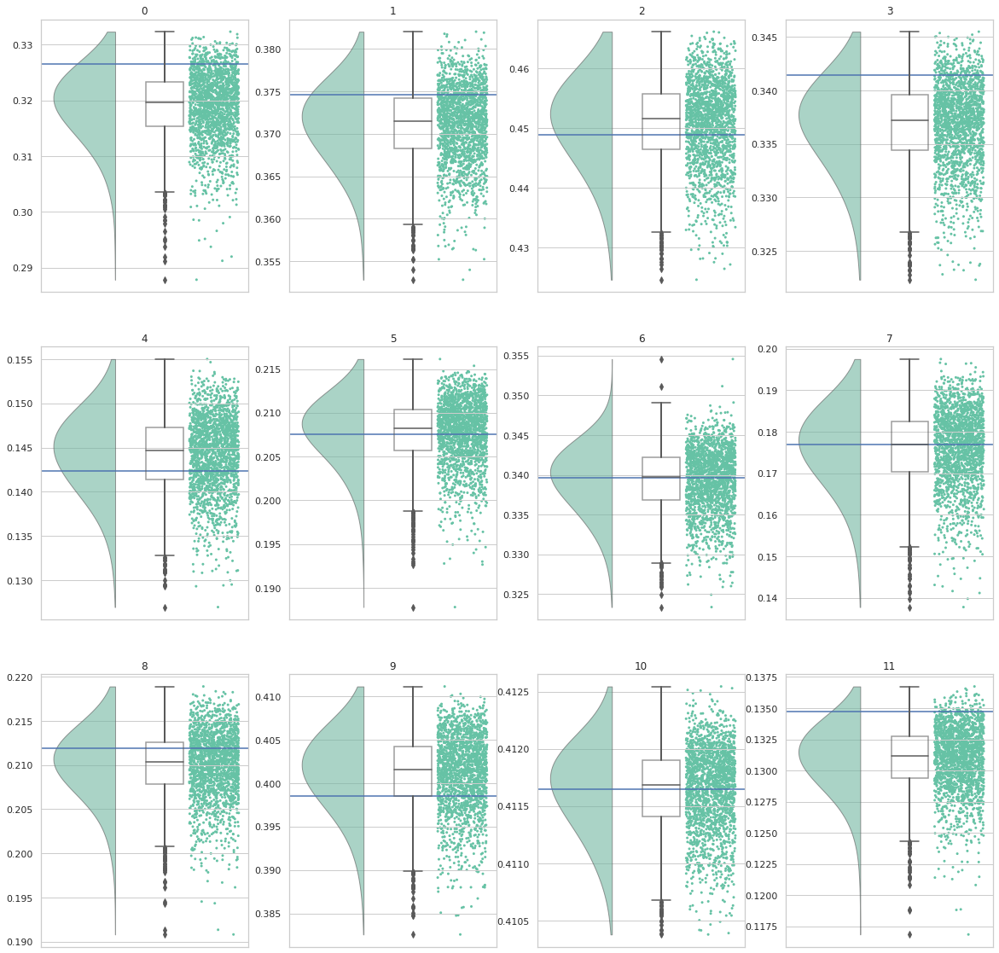

In [201]:
param = 't'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj.'+ str(i)))
    # ground parameter of subject effect
    spm =  group_params.loc[group_params['subj_idx']==i,'t'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = m1res_trace[varname], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)

##### a

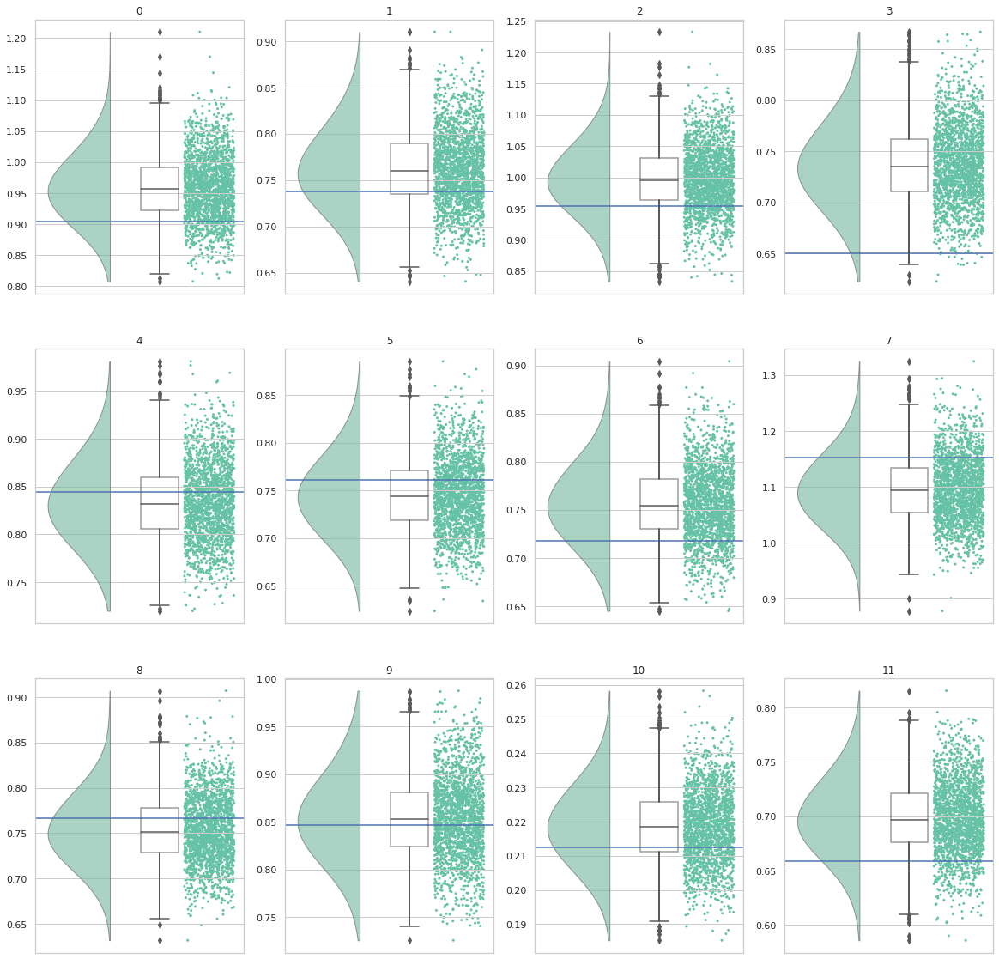

In [202]:
param = 'a'
# create figure
f,ax = plt.subplots(3,4,figsize=(20,20))
for i in range(n_subjs):
    varname = os.path.join(str(param +'_Intercept_subj.'+ str(i)))
    # ground parameter of subject effect
    spm =  group_params.loc[group_params['subj_idx']==i,'a'].values[0]
    # raincloud
    ax_i = ax[i//4,i%4]
    ax_i = pt.RainCloud(data = m1res_trace[varname], 
                  palette = 'Set2', 
                  bw = 0.6, 
                  width_viol=.5,
                  orient = 'v', 
                  alpha = .6, 
                  dodge = True,  
                  move = 0.2,
                  ax = ax_i)
    ax_i.axhline(spm)
    ax_i.xaxis.set_visible(False)
    ax_i.set_title(i)